<div style="background-color:#1a472a; padding:15px; border-radius:5px; text-align:center;">
  <h1 style="color:white; margin:0;">Previsão de Preços de Imóveis Comuns (Airbnb Rio)</h1>
</div>

<h3 style="border-bottom: 2px solid #1a472a; padding-bottom: 15px; margin-bottom: 10px;">1 -  Entendimento do desafio e da empresa/área</h3>

<li style="margin-bottom: 15px;">No Airbnb, qualquer pessoa que tenha um quarto ou um imóvel de qualquer tipo (apartamento, casa, chalé, pousada, etc.) pode ofertar o seu imóvel para ser alugado por diária.</li>

<li style="margin-bottom: 15px;">Você cria o seu perfil de host (pessoa que disponibiliza um imóvel para aluguel por diária) e cria o anúncio do seu imóvel.</li>

<li style="margin-bottom: 15px;">Nesse anúncio, o host deve descrever as características do imóvel da forma mais completa possível, de forma a ajudar os locadores/viajantes a escolherem o melhor imóvel para eles (e de forma a tornar o seu anúncio mais atrativo).</li>

<h3 style="padding-bottom: 15px; margin-bottom: 10px;">Objetivos:</h3>

<li style="margin-bottom: 15px;">Construir um modelo de previsão de preço que permita uma pessoa comum que possui um imóvel possa saber quanto deve cobrar pela diária do seu imóvel.</li>

<li style="margin-bottom: 15px;">Ou ainda, para o locador comum, dado o imóvel que ele está buscando, ajudar a saber se aquele imóvel está com preço atrativo (abaixo da média de imóveis com as mesmas características) ou não.</li>

<h3 style="padding-bottom: 15px; margin-bottom: 10px;">Bases de dados:</h3>

<li style="margin-bottom: 15px;">As bases de dados foram retiradas do site Kaggle: https://www.kaggle.com/allanbruno/airbnb-rio-de-janeiro</li>

<li style="margin-bottom: 15px;">As bases de dados são os preços dos imóveis obtidos e suas respectivas características em cada mês.</li>

<li style="margin-bottom: 15px;">Os preços são dados em reais (R$).</li>

<li style="margin-bottom: 15px;">Temos bases de abril de 2018 a maio de 2020, com exceção de junho de 2018 que não possui base de dados</li>

<h3 style="padding-bottom: 15px; margin-bottom: 10px;">Hipótese Iniciais:</h3>

<li style="margin-bottom: 15px;">A sazonalidade pode ser um fator importante, visto que meses como dezembro costumam ser bem caros no RJ</li>

<li style="margin-bottom: 15px;">A localização do imóvel deve fazer muita diferença no preço, já que no Rio de Janeiro a localização pode mudar completamente as características do lugar (segurança, beleza natural, pontos turísticos)</li>

<li style="margin-bottom: 15px;">Adicionais/Comodidades podem ter um impacto significativo, visto que temos muitos prédios e casas antigas no Rio de Janeiro</li>

<h3 style=padding-bottom: 15px; margin-bottom: 10px;">2 - Extração e Obtenção de Dados</h3>

In [ ]:
import time
import nltk
import joblib
import pathlib
import folium
import pandas as pd
import numpy as np
import seaborn as sns
from folium import LatLngPopup 
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from folium.plugins import MousePosition 
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor

import minha_funcoes as mf

In [2]:
meses = {'jan':1, 'fev':2, 'mar':3, 'abr':4, 'mai':5, 'jun':6,
         'jul':7, 'ago':8, 'set':9, 'out':10, 'nov':11, 'dez':12}

caminho_bases = pathlib.Path('dados')
lista_de_dataframes = []

for arquivo in caminho_bases.iterdir():
    
    nome_mes = arquivo.name[:3]
    mes = meses[nome_mes]
    
    ano = arquivo.name[-8:]
    ano = int(ano.replace('.csv', ''))
    
    df = pd.read_csv(caminho_bases / arquivo.name)
    
    df['ano'] = ano
    df['mes'] = mes
    
    lista_de_dataframes.append(df)
    
bases_airbnb = pd.concat(lista_de_dataframes, ignore_index=True)
    
display(bases_airbnb)

C:\Users\ronal\AppData\Local\Temp\ipykernel_10384\2886132980.py:15: DtypeWarning: Columns (62,87) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\ronal\AppData\Local\Temp\ipykernel_10384\2886132980.py:15: DtypeWarning: Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\ronal\AppData\Local\Temp\ipykernel_10384\2886132980.py:15: DtypeWarning: Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\ronal\AppData\Local\Temp\ipykernel_10384\2886132980.py:15: DtypeWarning: Columns (87) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\ronal\AppData\Local\Temp\ipykernel_10384\2886132980.py:15: DtypeWarning: Columns (61,62,94) have mixed t

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
902206,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
902207,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
902208,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


<h3 style=padding-bottom: 15px; margin-bottom: 10px;">3 - Ajustes e Limpeza de Dados</h3>

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">Seleção de colunas (interessantes para a análise)</h4>
                                                    
<li style="margin-bottom: 15px;">Como temos muitas colunas, nosso modelo pode acabar ficando muito lento.</li>
                                
<li style="margin-bottom: 15px;">Além disso, uma análise rápida permite ver que várias colunas não são necessárias para o nosso modelo de previsão, por isso, vamos excluir algumas colunas da nossa base.</li>
                                                     
<h4 style=padding-bottom: 15px; margin-bottom: 10px;">Tipos de colunas que vamos excluir:</h4>

<ol>
    <li style="margin-bottom: 15px;">IDs, Links e informações não relevantes para o modelo.</li>
    <li style="margin-bottom: 15px;">Colunas repetidas ou extremamente parecidas com outra (que dão a mesma informação para o modelo. Ex: Data x Ano/Mês).</li>
    <li style="margin-bottom: 15px;">Colunas preenchidas com texto livre [menos as colunas "name" (nome do anúncio) e "summary" (resumo do anúncio), pois iremos rodar uma análise de palavras após a previsão.]</li>
    <li style="margin-bottom: 15px;">Colunas em que todos ou quase todos os valores são iguais.</li>
</ol>

* Para isso, vamos criar um arquivo em excel com os 1.000 primeiros registros e fazer uma análise qualitativa.

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">3.1 - Seleção (Excel)</h4>

In [3]:
print(list(bases_airbnb.columns))
#bases_airbnb.head(1000).to_csv('primeiros registros.csv', sep=';')

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price', '

In [4]:
# Colunas selecionadas após a primeira análise feita no Excel

colunas = ['name','summary','host_response_time','host_response_rate','host_is_superhost','host_listings_count',
           'latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms',
           'beds','bed_type','amenities','square_feet','price','security_deposit','cleaning_fee',
           'guests_included','minimum_nights','maximum_nights','number_of_reviews',
           'review_scores_rating','review_scores_accuracy','review_scores_cleanliness',
           'review_scores_checkin','review_scores_communication','review_scores_location',
           'review_scores_value','instant_bookable','is_business_travel_ready','cancellation_policy',
           'ano','mes']

bases_airbnb = bases_airbnb.loc[:,colunas]
display(bases_airbnb.head(10))

,name,summary,host_response_time,host_response_rate,host_is_superhost,host_listings_count,latitude,longitude,property_type,room_type,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,ano,mes
0,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,NaN,f,1.0,-22.946854,-43.182737,Apartment,Entire home/apt,...,9.0,9.0,9.0,9.0,9.0,f,f,strict_14_with_grace_period,2018,4
1,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,within an hour,100%,t,2.0,-22.965919,-43.178962,Condominium,Entire home/apt,...,9.0,10.0,10.0,9.0,9.0,t,f,strict,2018,4
2,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,within an hour,100%,f,1.0,-22.985698,-43.201935,Apartment,Entire home/apt,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
3,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",within an hour,100%,f,3.0,-22.977117,-43.190454,Apartment,Entire home/apt,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
4,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,within an hour,100%,t,1.0,-22.983024,-43.214270,Apartment,Entire home/apt,...,10.0,10.0,10.0,10.0,9.0,t,f,strict,2018,4
5,Cosy flat close to Ipanema beach,This cosy apartment is just a few steps away ...,within an hour,100%,t,1.0,-22.988165,-43.193588,Apartment,Entire home/apt,...,9.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
6,COPACABANA SEA BREEZE - RIO,Our newly renovated studio is located in the b...,within an hour,100%,t,1.0,-22.981269,-43.190457,Loft,Entire home/apt,...,10.0,10.0,10.0,10.0,10.0,t,f,strict,2018,4
7,Copa Tabajaras,"Very quiet flat, with view on tropical jungle ...",within a day,50%,f,1.0,-22.966808,-43.186574,Apartment,Entire home/apt,...,NaN,NaN,NaN,NaN,NaN,f,f,moderate,2018,4
8,Beautiful studio in Santa with terrace,The property is very special. It is a studio w...,within a few hours,100%,f,3.0,-22.921990,-43.183836,Apartment,Entire home/apt,...,4.0,8.0,6.0,6.0,4.0,f,f,strict,2018,4
9,"Beach Block 6bed Penthouse, Ipanema Best Locat...",••Sunny terrace with side ocean view•• ••LOCAT...,within an hour,94%,f,6.0,-22.986333,-43.202563,Apartment,Entire home/apt,...,9.0,9.0,8.0,10.0,8.0,t,f,strict,2018,4


<h4 style=padding-bottom: 15px; margin-bottom: 10px;">3.2 - Seleção (Python)</h4>

In [5]:
# Verifica a quantidade de valores nulos por coluna
print(bases_airbnb.isnull().sum())

name                             1672
summary                         41804
host_response_time             401843
host_response_rate             401846
host_is_superhost                 460
host_listings_count               460
latitude                            0
longitude                           0
property_type                       0
room_type                           0
accommodates                        0
bathrooms                        1724
bedrooms                          850
beds                             2502
bed_type                            0
amenities                           0
square_feet                    888162
price                               0
security_deposit               421280
cleaning_fee                   313506
guests_included                     0
minimum_nights                      0
maximum_nights                      0
number_of_reviews                   0
review_scores_rating           448016
review_scores_accuracy         448586
review_score

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">3.3 - Tratar Valores Faltando (NaN) (com o objetivos de selecionar as colunas)</h4>
                                                     
<li style="margin-bottom: 15px;">Visualizando os dados, percebemos que existe uma grande disparidade em dados faltantes. As colunas com mais de 300.000 valores NaN foram excluídas da análise.</li>
                                
<li style="margin-bottom: 15px;">Para as outras colunas, como temos muitos dados (mais de 900.000 linhas) vamos excluir as linhas que contém dados NaN.</li>

In [6]:
for coluna in bases_airbnb:
    if bases_airbnb[coluna].isnull().sum() > 300000:
        bases_airbnb = bases_airbnb.drop(coluna, axis = 1)
        
# Resultado
print(bases_airbnb.shape)
print(bases_airbnb.isnull().sum())

(902210, 24)
name                         1672
summary                     41804
host_is_superhost             460
host_listings_count           460
latitude                        0
longitude                       0
property_type                   0
room_type                       0
accommodates                    0
bathrooms                    1724
bedrooms                      850
beds                         2502
bed_type                        0
amenities                       0
price                           0
guests_included                 0
minimum_nights                  0
maximum_nights                  0
number_of_reviews               0
instant_bookable                0
is_business_travel_ready        0
cancellation_policy             0
ano                             0
mes                             0
dtype: int64


<h4 style=padding-bottom: 15px; margin-bottom: 10px;">3.4 - Tratar Valores Faltando (NaN) (com o objetivo de selecionar as linhas)</h4>

In [7]:
bases_airbnb = bases_airbnb.dropna()

print(bases_airbnb.shape)
print(bases_airbnb.isnull().sum())

(856858, 24)
name                        0
summary                     0
host_is_superhost           0
host_listings_count         0
latitude                    0
longitude                   0
property_type               0
room_type                   0
accommodates                0
bathrooms                   0
bedrooms                    0
beds                        0
bed_type                    0
amenities                   0
price                       0
guests_included             0
minimum_nights              0
maximum_nights              0
number_of_reviews           0
instant_bookable            0
is_business_travel_ready    0
cancellation_policy         0
ano                         0
mes                         0
dtype: int64


<h4 style=padding-bottom: 15px; margin-bottom: 10px;">3.5 - Verificando os tipos de dados das colunas</h4>

In [8]:
print(bases_airbnb.dtypes)

name                         object
summary                      object
host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mes                           int64
dtype: object


In [9]:
print("Detalhes da primeira linha:")
primeira_linha = bases_airbnb.iloc[0]
for indice, valor in primeira_linha.items():
    print(f"{indice}: {valor}")

Detalhes da primeira linha:
name: Living in a Postcard
summary: Besides the most iconic's view, our apartment has a great location for tourist stay, safe and easy transportation throughout the city  (Metro 5 min) and offering all kinds of shops, juice bars, restaurants, supermarkets, cafes, cinemas and more.
host_is_superhost: f
host_listings_count: 1.0
latitude: -22.946854109114245
longitude: -43.182737237144536
property_type: Apartment
room_type: Entire home/apt
accommodates: 4
bathrooms: 1.0
bedrooms: 0.0
beds: 2.0
bed_type: Real Bed
amenities: {TV,Internet,"Air conditioning",Kitchen,Doorman,Elevator,"Family/kid friendly",Washer,Hangers,Iron,"Laptop friendly workspace"}
price: $133.00
guests_included: 2
minimum_nights: 60
maximum_nights: 365
number_of_reviews: 38
instant_bookable: f
is_business_travel_ready: f
cancellation_policy: strict_14_with_grace_period
ano: 2018
mes: 4


In [10]:
# Como price esta sendo reconhecidas como objeto (ao invés de ser um float) temos que mudar o tipo de variável
# também vamos mudar host_listings_count, bedrooms e beds para int


bases_airbnb['price'] = bases_airbnb['price'].str.replace('$','')  # tirando o cifrão ($)
bases_airbnb['price'] = bases_airbnb['price'].str.replace(',','')  # tirando a virgula 
bases_airbnb['price'] = bases_airbnb['price'].astype(np.float32, copy = False) # transformando em float (32 pq oculpa menos memoria)

bases_airbnb['host_listings_count'] = bases_airbnb['host_listings_count'].astype(np.int32, copy = False)
bases_airbnb['bedrooms'] = bases_airbnb['bedrooms'].astype(np.int32, copy = False)
bases_airbnb['beds'] = bases_airbnb['beds'].astype(np.int32, copy = False)

# Não posso colocar bathrooms para int por tem valores por exemplo como 1,5 e 3,5

print(bases_airbnb.dtypes)

name                         object
summary                      object
host_is_superhost            object
host_listings_count           int32
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                      int32
beds                          int32
bed_type                     object
amenities                    object
price                       float32
guests_included               int64
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mes                           int64
dtype: object


<h3 style=padding-bottom: 15px; margin-bottom: 10px;">4 - Análise exploratória e tratamento de outliers </h3>
                  
<h4 style=padding-bottom: 15px; margin-bottom: 10px;">Vamos basicamente olhar feature por feature (coluna por coluna) para:</h4>

<ol>
    <li style="margin-bottom: 15px;">Ver a correlação entre as features e decidir se manteremos todas as features que temos.</li>
    <li style="margin-bottom: 15px;">Excluir outliers, já que o objetivo é construir um modelo de previsão de preços para imóveis comuns (usaremos como regra, valores abaixo de Q1−1.5×Amplitude e valores acima de Q3+1.5×Amplitude). Amplitude=Q3−Q1.</li>
    <li style="margin-bottom: 15px;">Confirmar se todas as features que temos fazem realmente sentido para o nosso modelo ou se alguma delas não vai nos ajudar e se devemos excluir.</li>
</ol>

<li style="margin-bottom: 15px;">Vamos começar pela coluna de preço (resultado final que queremos prever).</li>

<li style="margin-bottom: 15px;">Depois vamos analisar as outras colunas de valores numéricos (accommodates, bedrooms, guests_included, etc.).</li>

<li style="margin-bottom: 15px;">Por fim, vamos avaliar as colunas de texto e definir quais categorias fazem sentido mantermos ou não.</li>

<h4 style=padding-bottom: 10px; margin-bottom: 10px;">4.1 - Correlações (Colunas númericas) </h4>

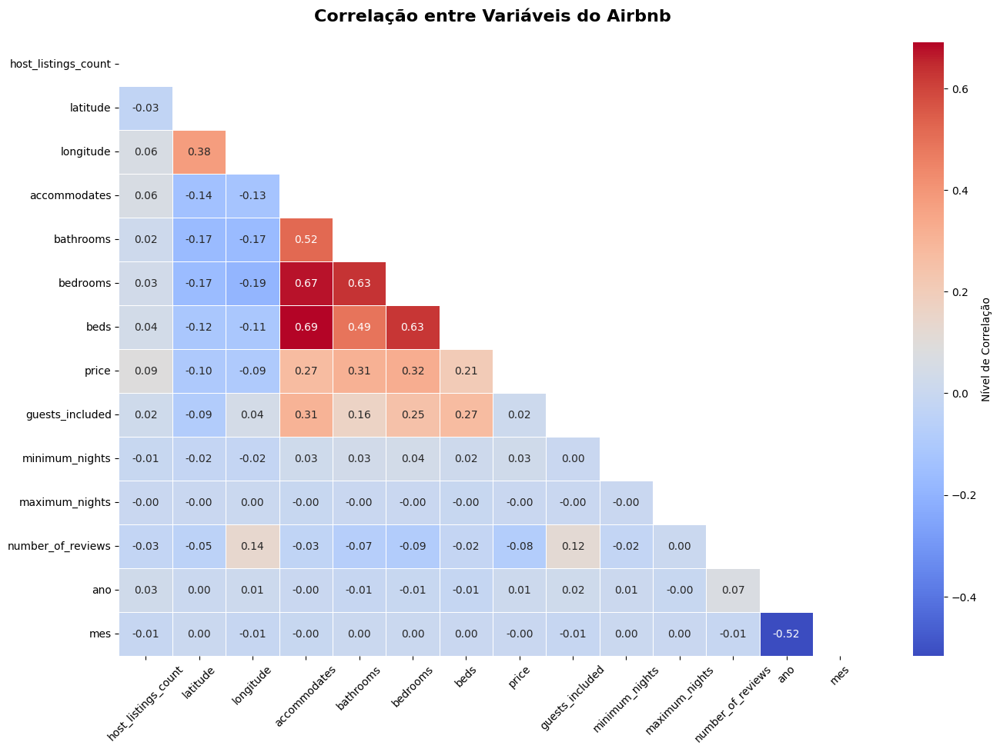

In [11]:
mf.plot_correlation_heatmap(
    bases_airbnb,
    title="Correlação entre Variáveis do Airbnb"
)

<h4 style=padding-bottom: 10px; margin-bottom: 10px;">4.2 - Análise gráfica</h4>

<h5 style=padding-bottom: 10px; margin-bottom: 10px;"> > price</h5>

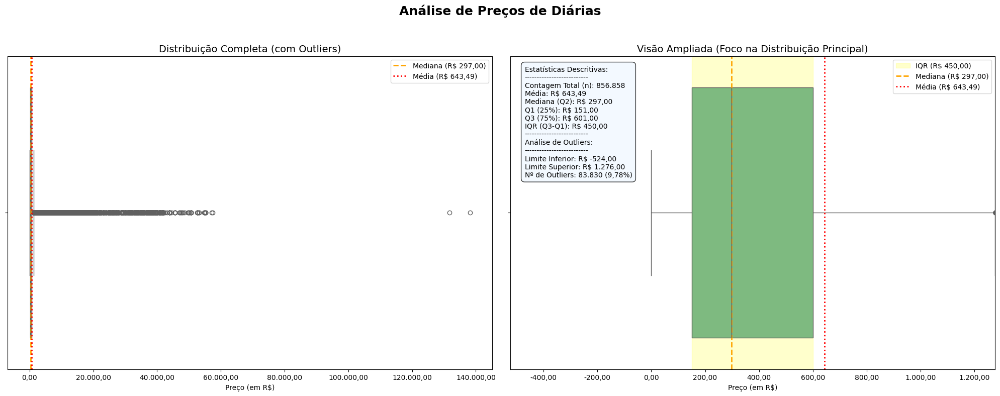

In [12]:
mf.plot_boxplot_informativo_reais(
    bases_airbnb['price'],
    format_as_currency=True,
    titulo="Análise de Preços de Diárias",
    nome_eixo_x="Preço (em R$)"
)

<h3 style="padding-bottom: 10px; margin-bottom: 10px;">Importante: Dado que o escopo do modelo é a precificação de imóveis residenciais padrão, <strong>os valores identificados como outliers superiores são interpretados como pertencentes ao segmento de alto luxo.</strong> Como este nicho está fora do nosso objetivo de análise, optou-se pela remoção desses pontos para garantir que o modelo reflita apenas o mercado-alvo. (Ao final desta seção, é apresentada uma tabela que consolida cada ação de tratamento de dados realizada, juntamente com sua respectiva justificativa)</h3>


In [13]:
bases_airbnb, linhas_removidas = mf.excluir_outliers(bases_airbnb, 'price')
print('{} linhas removidas'.format(linhas_removidas))

83830 linhas removidas


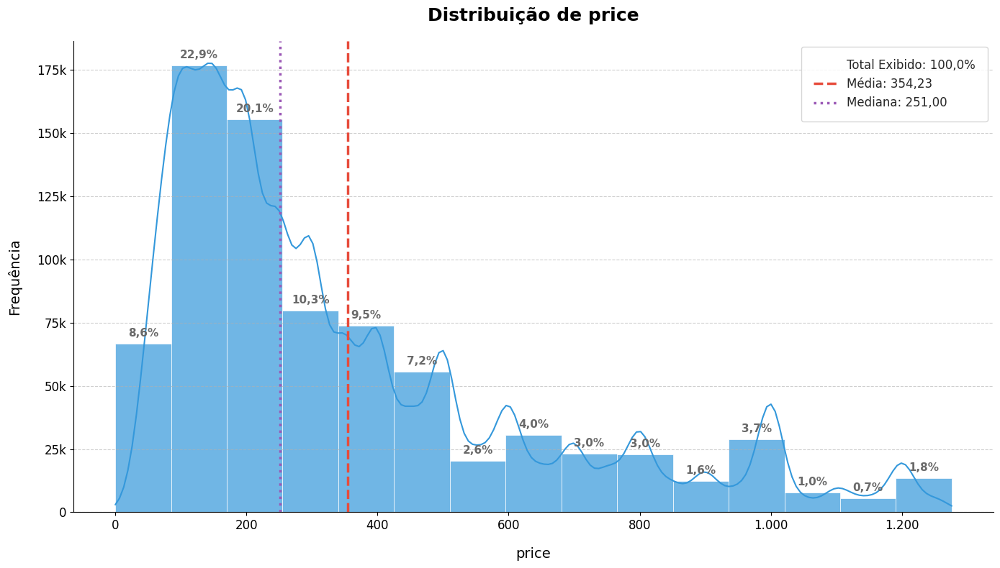

In [14]:
mf.plot_histogram(
    bases_airbnb['price'],
    bins=15,
    title='Distribuição de price',
    show_mean=True,
    show_median=True,
    show_perc_on_bar=True # Habilitando a porcentagem nas barras e o "Total Exibido"
)

<p style="margin-bottom: 15px;">Analisando o gráfico "Distribuição de 'Price' com Métricas Centrais", podemos extrair várias conclusões importantes sobre os dados de preço.</p>

<p style="margin-bottom: 15px;">1. Assimetria Positiva (à Direita)</p>

<p style="margin-bottom: 15px;">A conclusão mais imediata e importante é que a distribuição dos preços é fortemente assimétrica à direita (ou positiva).</p>

<li style="margin-bottom: 15px;">O que isso significa? A grande maioria dos preços está concentrada na faixa mais baixa (à esquerda do gráfico), enquanto uma quantidade menor de itens com preços muito altos "puxa" a cauda do gráfico para a direita.</li>

<li style="margin-bottom: 15px;">Interpretação de Negócio: Isso é típico de mercados como o imobiliário (muitos apartamentos padrão, algumas coberturas de luxo) ou de produtos (muitos itens básicos, alguns produtos premium/de colecionador). Existe um volume muito maior de itens "comuns" e um número limitado de itens "de luxo".</li>

<p style="margin-bottom: 15px;">2. Média vs. Mediana: A História Central</p>

<p style="margin-bottom: 15px;">A relação entre a média e a mediana é a chave para entender essa distribuição:</p>

<li style="margin-bottom: 15px;">Observação: A Média (353,89) é significativamente maior que a Mediana (251,00).</li>

<li style="margin-bottom: 15px;">Causa: Isso é uma consequência direta da assimetria. Os poucos valores muito altos na cauda direita "inflacionam" a média, puxando-a para cima. A mediana, por outro lado, não é afetada por esses valores extremos, pois ela representa apenas o ponto central que divide os dados em duas metades iguais.</li>

<li style="margin-bottom: 15px;">Conclusão Crítica: Para descrever o "preço típico" ou o valor central deste conjunto de dados, a Mediana (251,00) é uma métrica muito mais representativa e confiável do que a Média. Se você dissesse que o preço médio é ~354, estaria dando um valor que é maior do que o preço de mais da metade dos itens. O preço de 251,00 representa muito melhor o "centro de gravidade" da população comum.</li>

<p style="margin-bottom: 15px;">3. Concentração de Preços (Moda)</p>

<p style="margin-bottom: 15px;">O gráfico mostra claramente onde os preços mais comuns se encontram.</p>

<li style="margin-bottom: 15px;">Pico da Distribuição: A faixa de preço com a maior frequência (a moda) está entre RS 150 e RS 300. A barra mais alta, que representa mais de 20% de todos os dados, está centrada em torno de RS 250.</li>

<li style="margin-bottom: 15px;">Implicação: A maior parte da atividade comercial ou dos itens disponíveis ocorre nessa faixa de preço. Qualquer estratégia de marketing ou produto para o "público geral" deveria focar intensamente nessa faixa.</li>

<p style="margin-bottom: 15px;">4. Dispersão e a "Cauda Longa" de Preços Altos:</p>

<li style="margin-bottom: 15px;">Cauda Longa: Mesmo após a remoção dos outliers estatísticos (os pontos mais extremos e anômalos), o gráfico ainda exibe uma cauda longa e persistente à direita. Isso indica que, dentro do conjunto de dados "limpo", ainda existe uma subpopulação real e válida de itens com preços significativamente mais altos que a maioria.</li>

<li style="margin-bottom: 15px;">De "Outliers" para "Segmento de Nicho": Esses pontos na cauda (preços de 600, 800, 1200) não devem mais ser vistos como "outliers" a serem descartados, mas sim como a representação de um segmento de mercado de maior valor. Eles são menos frequentes, mas fazem parte da dinâmica normal do negócio. Podem representar, por exemplo, imóveis maiores, em localizações premium ou com mais comodidades, que são naturalmente mais caros, mas não chegam a ser os "pontos fora da curva" (já removidos).</li>


> - **price** (ok)
> - **host_listings_count**
> - **accommodates**
> - **bathrooms**
> - **bedrooms**
> - **beds**
> - **guests_included**
> - **minimum_nights**
> - **maximum_nights**
> - **number_of_reviews**

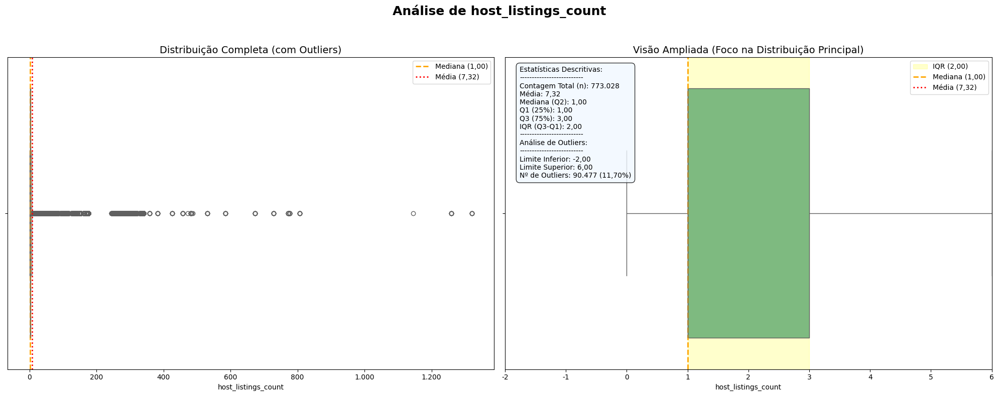

In [15]:
mf.plot_boxplot_informativo(
    bases_airbnb['host_listings_count'],
    format_as_currency=False,
    titulo="Análise de host_listings_count",
    nome_eixo_x="host_listings_count"
)

In [16]:
bases_airbnb, linhas_removidas = mf.excluir_outliers(bases_airbnb, 'host_listings_count')
print('{} linhas removidas'.format(linhas_removidas))

90477 linhas removidas


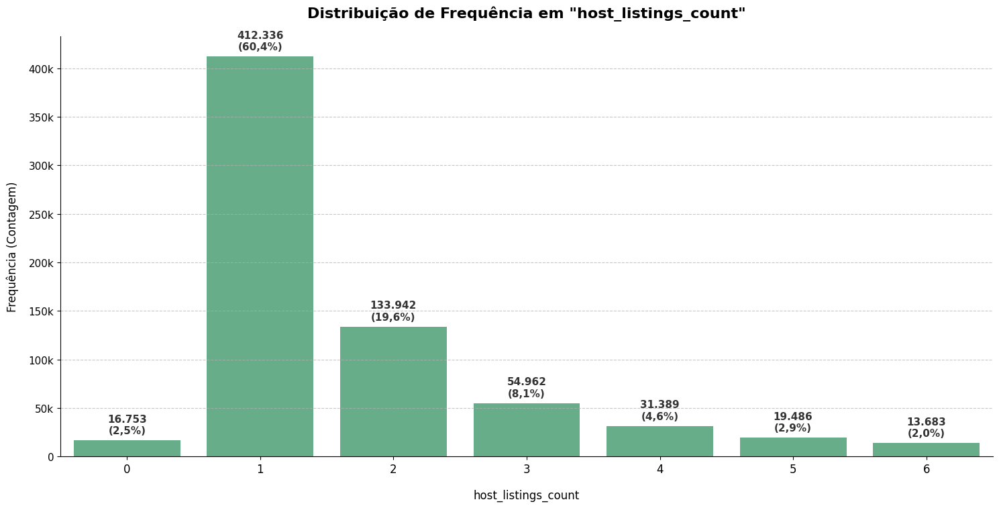

In [17]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['host_listings_count']
)

> - **price** (ok)
> - **host_listings_count** (ok)
> - **accommodates**
> - **bathrooms**
> - **bedrooms**
> - **beds**
> - **guests_included**
> - **minimum_nights**
> - **maximum_nights**
> - **number_of_reviews**

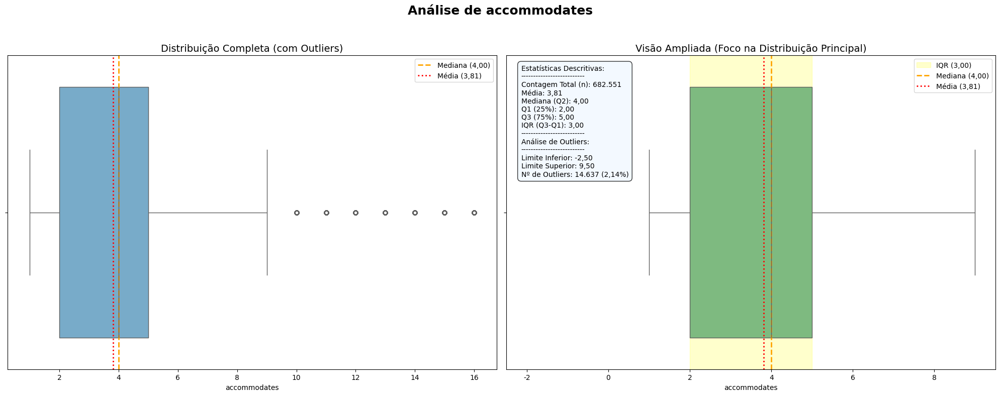

In [18]:
mf.plot_boxplot_informativo(
    bases_airbnb['accommodates'],
    format_as_currency=False,
    titulo="Análise de accommodates",
    nome_eixo_x="accommodates"
)

In [19]:
bases_airbnb, linhas_removidas = mf.excluir_outliers(bases_airbnb, 'accommodates')
print('{} linhas removidas'.format(linhas_removidas))

14637 linhas removidas


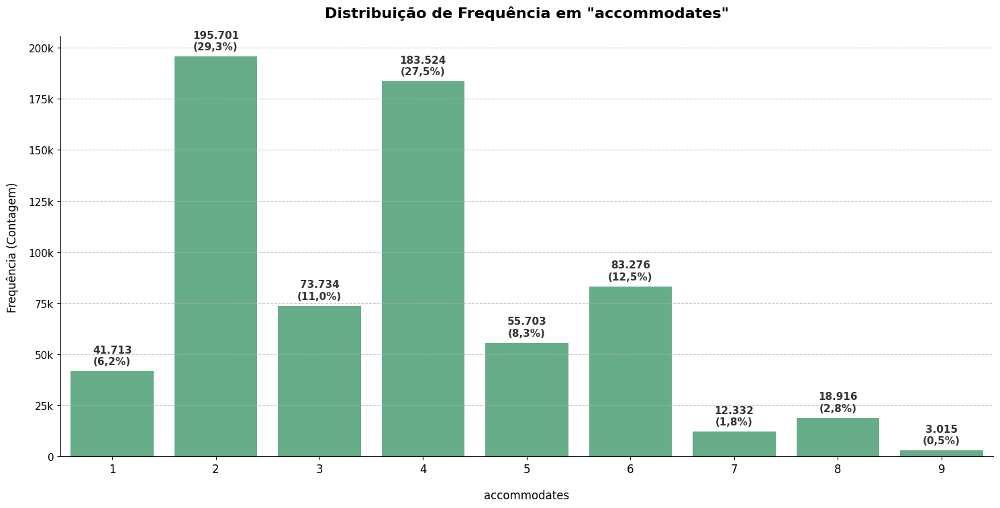

In [20]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['accommodates']
)

> - **price** (ok)
> - **host_listings_count** (ok)
> - **accommodates** (ok)
> - **bathrooms**
> - **bedrooms**
> - **beds**
> - **guests_included**
> - **minimum_nights**
> - **maximum_nights**
> - **number_of_reviews**

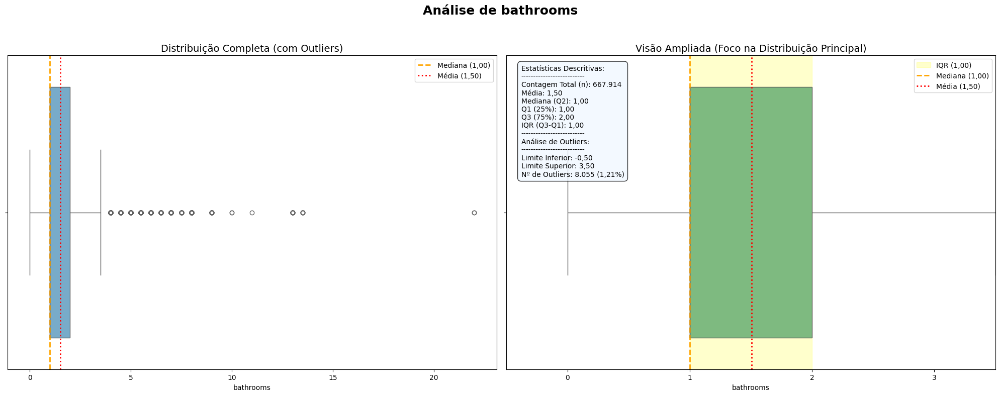

In [21]:
mf.plot_boxplot_informativo(bases_airbnb['bathrooms'],
    format_as_currency=False,
    titulo="Análise de bathrooms",
    nome_eixo_x="bathrooms")

In [22]:
bases_airbnb, linhas_removidas = mf.excluir_outliers(bases_airbnb, 'bathrooms')
print('{} linhas removidas'.format(linhas_removidas))

8055 linhas removidas


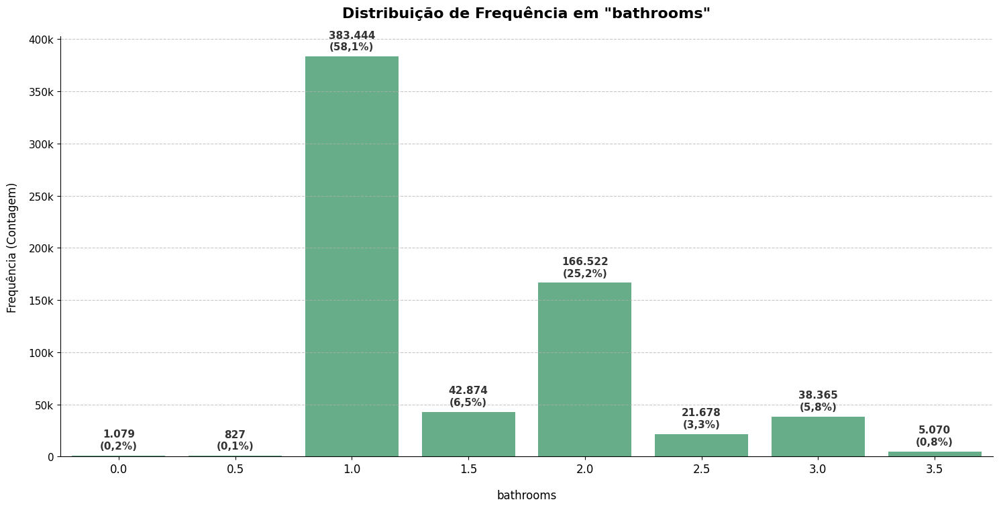

In [23]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['bathrooms']
)

> - **price** (ok)
> - **host_listings_count** (ok)
> - **accommodates** (ok)
> - **bathrooms** (ok)
> - **bedrooms**
> - **beds**
> - **guests_included**
> - **minimum_nights**
> - **maximum_nights**
> - **number_of_reviews**

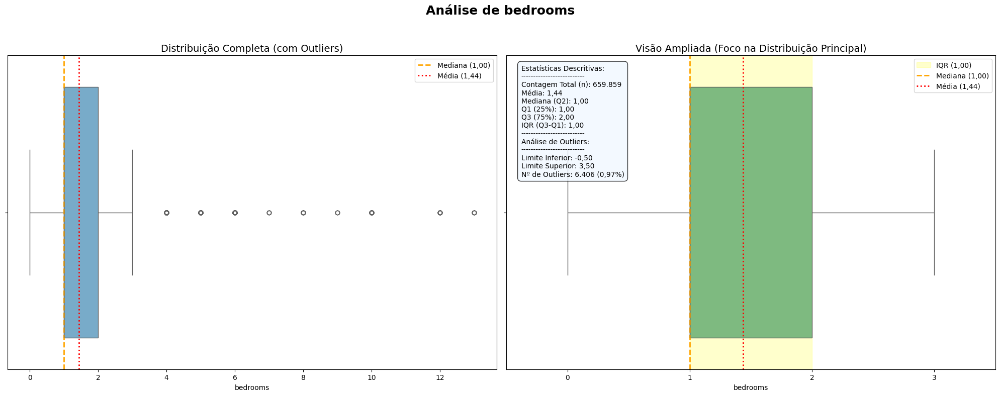

In [24]:
mf.plot_boxplot_informativo(
    bases_airbnb['bedrooms'],
    format_as_currency=False,
    titulo="Análise de bedrooms",
    nome_eixo_x="bedrooms"
)

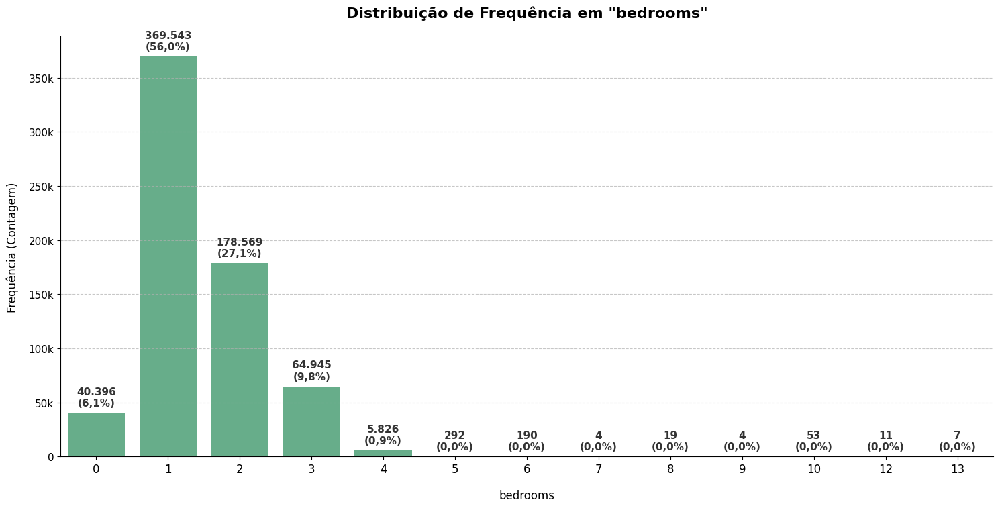

In [25]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['bedrooms']
)

In [26]:
bases_airbnb, linhas_removidas = mf.excluir_outliers(bases_airbnb, 'bedrooms')
print('{} linhas removidas'.format(linhas_removidas))

6406 linhas removidas


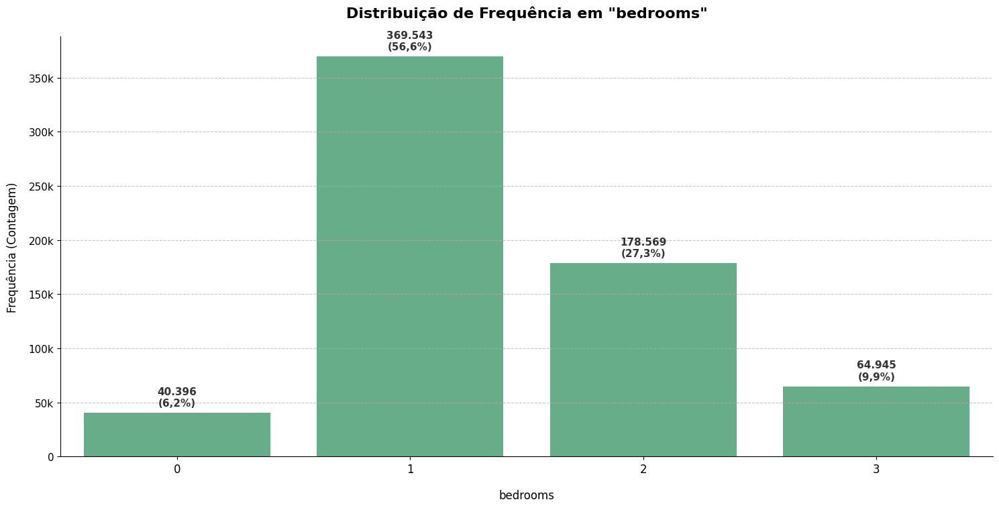

In [27]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['bedrooms']
)

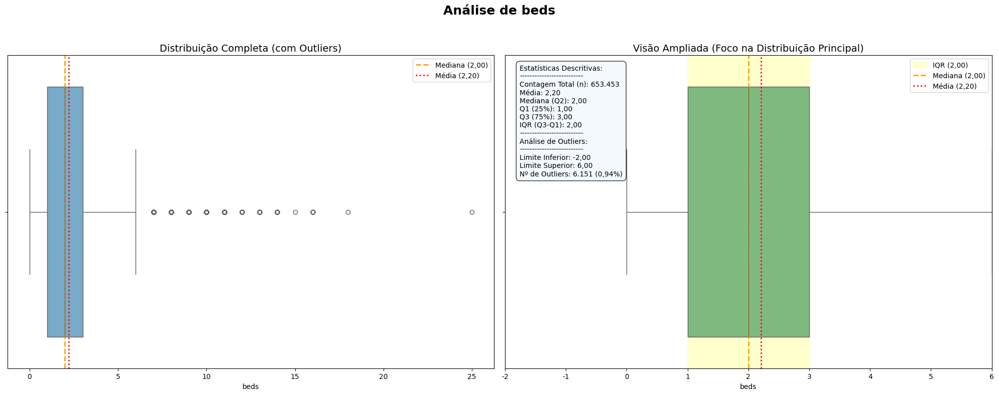

In [28]:
mf.plot_boxplot_informativo(
    bases_airbnb['beds'],
    format_as_currency=False,
    titulo="Análise de beds",
    nome_eixo_x="beds"
)

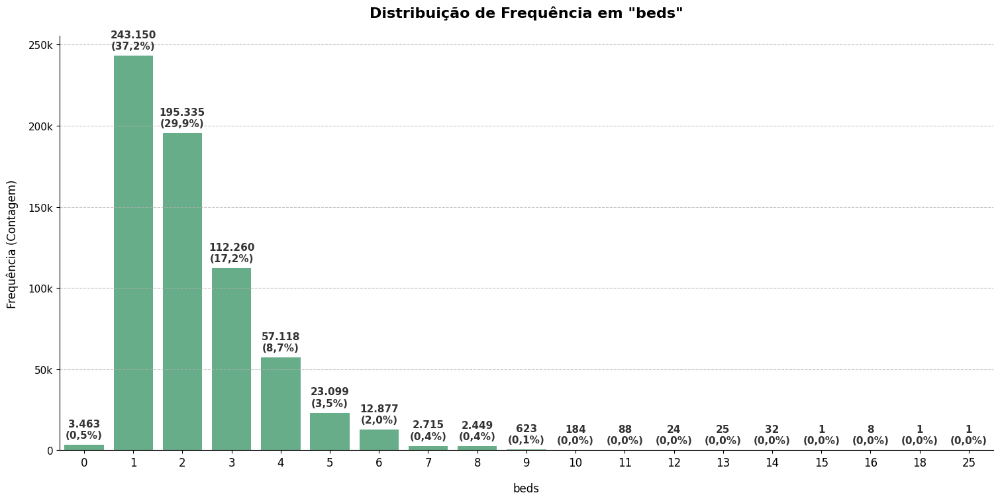

In [29]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['beds']
)

In [30]:
bases_airbnb, linhas_removidas = mf.excluir_outliers(bases_airbnb, 'beds')
print('{} linhas removidas'.format(linhas_removidas))

6151 linhas removidas


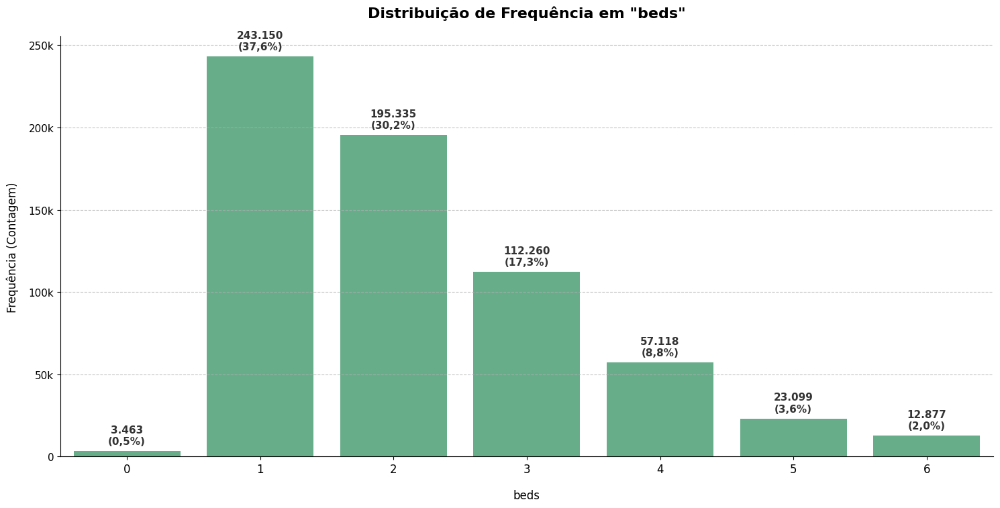

In [31]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['beds']
)

> - **price** (ok)
> - **host_listings_count** (ok)
> - **accommodates** (ok)
> - **bathrooms** (ok)
> - **bedrooms** (ok)
> - **beds** (ok)
> - **guests_included**
> - **minimum_nights**
> - **maximum_nights**
> - **number_of_reviews**

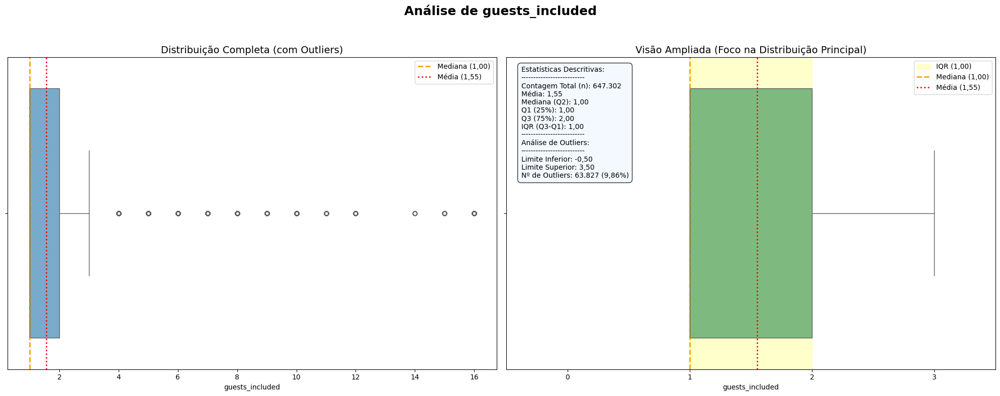

In [32]:
mf.plot_boxplot_informativo(
    bases_airbnb['guests_included'],
    format_as_currency=False,
    titulo="Análise de guests_included",
    nome_eixo_x="guests_included"
)

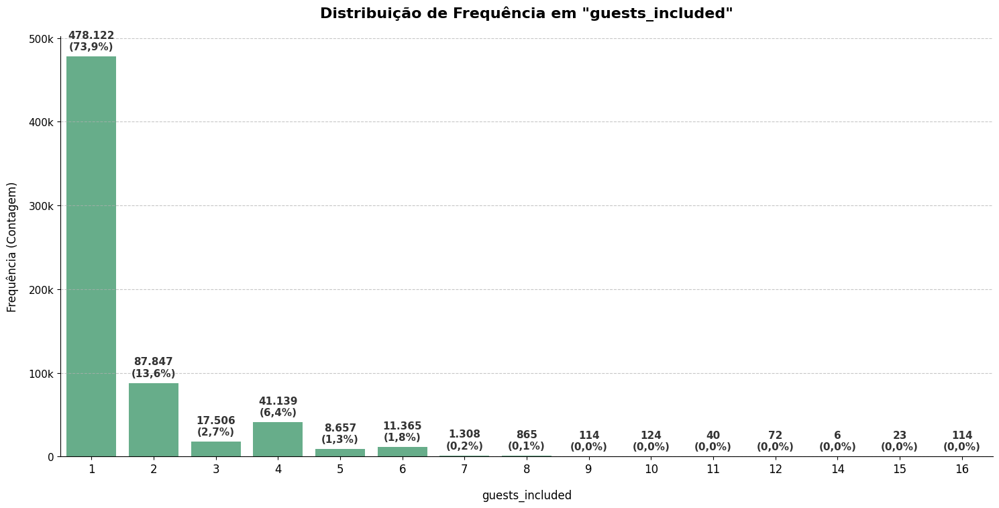

In [33]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['guests_included']
)

In [34]:
# A feature guests_included será removida da análise. 
# A investigação dos dados revelou que a grande maioria dos anúncios utiliza o valor padrão de '1 hóspede incluído'. 
# Essa baixa variância indica que a feature possui pouco ou nenhum poder preditivo sobre o preço. 
# Portanto, sua exclusão é necessária para evitar que o modelo atribua importância a um atributo que, na prática, não é um diferenciador de valor.

bases_airbnb = bases_airbnb.drop('guests_included',axis=1)

> - **price** (ok)
> - **host_listings_count** (ok)
> - **accommodates** (ok)
> - **bathrooms** (ok)
> - **bedrooms** (ok)
> - **beds** (ok)
> - **guests_included** (ok)
> - **minimum_nights**
> - **maximum_nights**
> - **number_of_reviews**

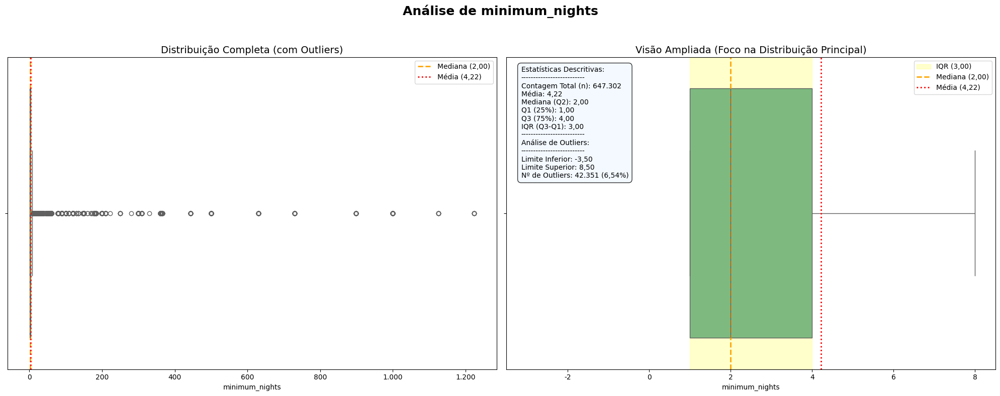

In [35]:
mf.plot_boxplot_informativo(
    bases_airbnb['minimum_nights'],
    format_as_currency=False,
    titulo="Análise de minimum_nights",
    nome_eixo_x="minimum_nights"
)

In [36]:
bases_airbnb, linhas_removidas = mf.excluir_outliers(bases_airbnb, 'minimum_nights')
print('{} linhas removidas'.format(linhas_removidas))

42351 linhas removidas


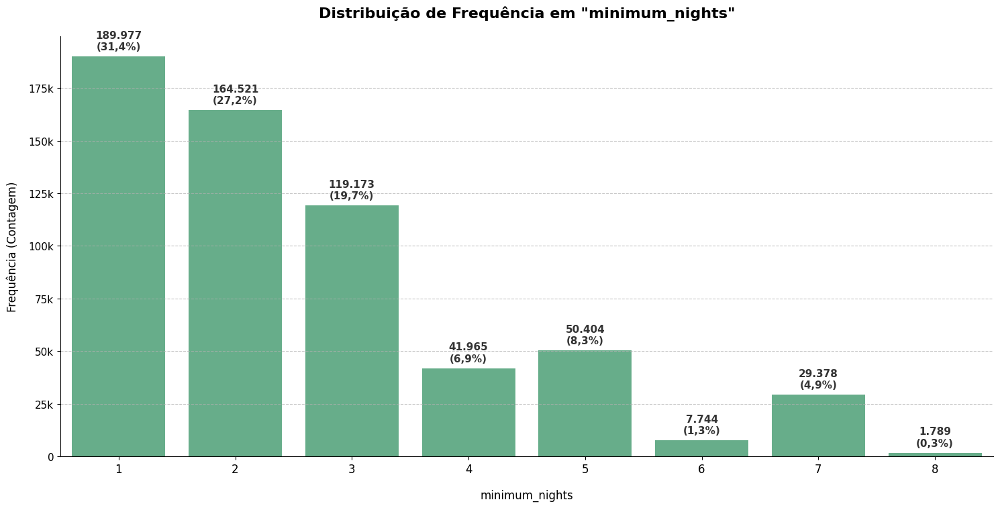

In [37]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['minimum_nights']
)

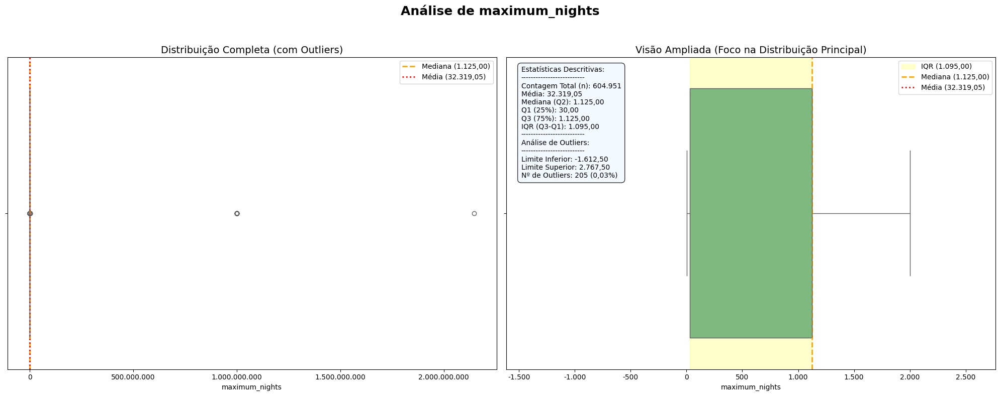

In [38]:
mf.plot_boxplot_informativo(
    bases_airbnb['maximum_nights'],
    format_as_currency=False,
    titulo="Análise de maximum_nights",
    nome_eixo_x="maximum_nights"
)

In [39]:
bases_airbnb = bases_airbnb.drop('maximum_nights',axis=1)

> - **price** (ok)
> - **host_listings_count** (ok)
> - **accommodates** (ok)
> - **bathrooms** (ok)
> - **bedrooms** (ok)
> - **beds** (ok)
> - **guests_included** (ok)
> - **minimum_nights** (ok)
> - **maximum_nights** (ok)
> - **number_of_reviews**

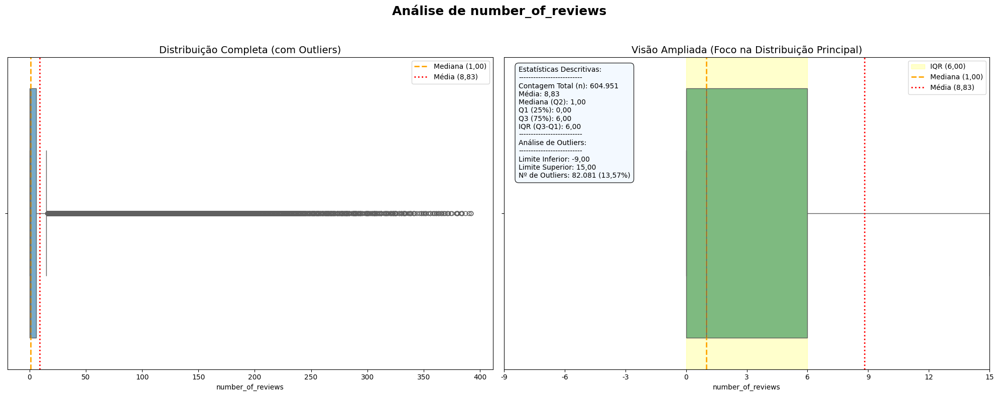

In [40]:
mf.plot_boxplot_informativo(
    bases_airbnb['number_of_reviews'],
    format_as_currency=False,
    titulo="Análise de number_of_reviews",
    nome_eixo_x="number_of_reviews"
)

In [41]:
bases_airbnb = bases_airbnb.drop('number_of_reviews',axis=1)

> - **price** (ok)
> - **host_listings_count** (ok)
> - **accommodates** (ok)
> - **bathrooms** (ok)
> - **bedrooms** (ok)
> - **beds** (ok)
> - **guests_included** (ok)
> - **minimum_nights** (ok)
> - **maximum_nights** (ok)
> - **number_of_reviews** (ok)

<h4 style=padding-bottom: 10px; margin-bottom: 10px;">Resumo do que foi feito</h4>

<!DOCTYPE html>
<html lang="pt-br">
<head>
<meta charset="UTF-8">
<title>Tabela de Features</title>
<style>
    /* Estilo geral para a página, para um melhor visual */
    body {
        background-color: #1e1e1e;
        display: flex;
        justify-content: center;
        align-items: center;
        min-height: 100vh;
        margin: 0;
        font-family: sans-serif;
    }

    /* Estilos da tabela */
    .data-table {
        width: 100%;
        max-width: 800px; /* Define uma largura máxima */
        border-collapse: collapse; /* Remove o espaço entre as bordas */
        font-family: monospace;
        color: #E0E0E0;
        background-color: #2D2D2D;
        border-radius: 8px; /* Adiciona cantos arredondados */
        overflow: hidden; /* Garante que o fundo não vaze dos cantos */
        box-shadow: 0 4px 15px rgba(0,0,0,0.3); /* Adiciona uma sombra sutil */
    }

    /* Estilo para todas as células (cabeçalho e dados) */
    .data-table th,
    .data-table td {
        padding: 12px 15px; /* Espaçamento interno mais consistente */
        text-align: left; /* Alinhamento padrão à esquerda */
    }

    /* Estilo específico para o cabeçalho */
    .data-table thead {
        background-color: #3a3a3a; /* Cor de fundo um pouco diferente para o cabeçalho */
        color: #FFFFFF; /* Texto branco para maior destaque */
        font-weight: bold;
    }
    
    /* Estilo para as linhas do corpo da tabela */
    .data-table tbody tr {
        border-bottom: 1px solid #444; /* Linha sutil para separar as linhas */
    }

    .data-table tbody tr:last-child {
        border-bottom: none; /* Remove a borda da última linha */
    }

    /* Classes de utilidade para alinhamento de texto */
    .text-center {
        text-align: center;
    }

    .text-right {
        text-align: right;
    }
</style>
</head>
<body>

<table class="data-table">
  <thead>
    <tr>
      <th>Feature</th>
      <th class="text-center">Formato</th>
      <th class="text-center">Status</th>
      <th class="text-right">Descrição (opcional)</th>
      <th class="text-right">Ação</th>
      <th class="text-right">Motivo</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>price</td>
      <td class="text-center">float32</td>
      <td class="text-right">(Ok)</td>
      <td class="text-right">(Preço)</td>
      <td class="text-right">Outliers Removidos</td>
      <td class="text-right">Dado que o escopo do modelo é a precificação de imóveis residenciais padrão, <strong> os valores identificados como outliers superiores são interpretados como pertencentes ao segmento de alto luxo. </strong> Como este nicho está fora do nosso objetivo de análise, optou-se pela remoção desses pontos para garantir que o modelo reflita o mercado-alvo.</td>
    </tr>
    <tr>
      <td>host_listings_count</td>
      <td class="text-center">int32</td>
      <td class="text-right">(Ok)</td>
      <td class="text-right">(quantos imoveis a pessoa tem disponivel no airbnb)</td>
      <td class="text-right">Outliers Removidos</td>
      <td class="text-right">Para garantir que a análise se concentre no público-alvo deste projeto, optou-se por excluir os outliers. <strong> Definimos como outlier qualquer anfitrião com mais de 6 imóveis cadastrados. A premissa é que perfis com esse volume são representativos de imobiliárias ou gestores profissionais, e não do anfitrião individual que constitui o foco do estudo. </strong></td>
    </tr>
    <tr>
      <td>accommodates</td>
      <td class="text-center">int64</td>
      <td class="text-right">(Ok)</td>
      <td class="text-center">(Quantos hóspedes o local pode acomodar)</td>
      <td class="text-right">Outliers Removidos</td>
      <td class="text-right"> <strong>Imóveis com capacidade de acomodação muito alta são raros e representam um nicho de mercado distinto (ex: mansões, albergues, espaços para eventos). </strong>A remoção desses outliers evita que poucos casos extremos distorçam o aprendizado do modelo, permitindo que ele se ajuste de forma mais precisa à grande maioria dos imóveis residenciais.</td> 
    </tr>
    <tr>
      <td>bathrooms</td>
      <td class="text-center">float64</td>
      <td class="text-right">(Ok)</td>
      <td class="text-center">(Quantidade de banheiros)</td>
      <td class="text-right">Outliers Removidos</td>
      <td class="text-right"><strong>Propriedades com um número excessivo de banheiros são raras e, geralmente, associadas a imóveis de luxo (ex: mansões, coberturas).</strong> Para que o modelo entenda corretamente o valor de um banheiro em um imóvel padrão, esses pontos extremos são removidos, evitando distorções na análise de preço.</td> 
    </tr>
    <tr>
      <td>bedrooms</td>
      <td class="text-center">int32</td>
      <td class="text-right">(Ok)</td>
      <td class="text-center">(Quantidade de quartos)</td>
      <td class="text-right">Outliers Removidos</td>
      <td class="text-right"><strong>Imóveis com um número muito elevado de quartos pertencem a uma categoria de nicho (ex: mansões, grandes casas para grupos), que não representa o mercado residencial típico. </strong> A remoção desses outliers é crucial para que o modelo aprenda a relação correta entre quartos e preço para apartamentos e casas padrão.</td>  
    </tr>
    <tr>
      <td>beds</td>
      <td class="text-center">int32</td>
      <td class="text-right">(Ok)</td>
      <td class="text-center">(Quantidade de camas)</td>
      <td class="text-right">Outliers Removidos</td>
      <td class="text-right"><strong>Uma quantidade excessiva de camas geralmente indica um perfil de aluguel para grandes grupos ou um modelo de negócio similar a albergues (hostels).  </strong>Esses imóveis têm uma estrutura de preços diferente, que pode confundir o modelo. A exclusão desses casos foca a análise em acomodações residenciais convencionais.</td>
    </tr>
      <tr>
      <td>guests_included</td>
      <td class="text-center">int64</td>
      <td class="text-right">(Ok)</td>
      <td class="text-right">(quantas pessoas estão incluidas no pacote)</td>
      <td class="text-right">Remoção da Feature</td>
      <td class="text-right"><strong>A investigação dos dados revelou que a grande maioria dos anúncios utiliza o valor padrão de '1 hóspede incluído'. Essa baixa variância indica que a feature possui pouco ou nenhum poder preditivo sobre o preço.</strong> Portanto, sua exclusão é necessária para evitar que o modelo atribua importância a um atributo que, na prática, não é um diferenciador de valor.</td>
    </tr>
    <tr>
    <tr>
      <td>minimum_nights</td>
      <td class="text-center">int64</td>
      <td class="text-right">(Ok)</td>
      <td class="text-right">(Número mínimo de noites)</td>
      <td class="text-right">Outliers Removidos</td>
      <td class="text-right">Valores identificados como outliers superiores (acima de 8 noites) são interpretados como não pertencentes ao segmento da aplicação</td>
    </tr>
    <tr>
      <td>maximum_nights</td>
      <td class="text-center">int64</td>
      <td class="text-right">(Ok)</td>
      <td class="text-right">(Número máximo de noites)</td>
      <td class="text-right">Remoção da Feature</td>
      <td class="text-right">Por ter baixo poder preditivo sobre o preço da diária, sua remoção simplifica o modelo sem perda de performance.</td>
    </tr>
    <tr>
      <td>number_of_reviews</td>
      <td class="text-center">int64</td>
      <td class="text-right">(Ok)</td>
      <td class="text-right">(Número de avaliações)</td>
      <td class="text-right">Remoção da Feature</td>
      <td class="text-right">Por ter baixo poder preditivo sobre o preço da diária, sua remoção simplifica o modelo sem perda de performance.</td>
    </tr>
  </tbody>
</table>
</body>
</html>

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">4.3 - Tratamento de dados categoricos ou texto </h4>

> - **property_type** 
> - **room_type** 
> - **bed_type** 
> - **cancellation_policy** 
> - **amenities** 

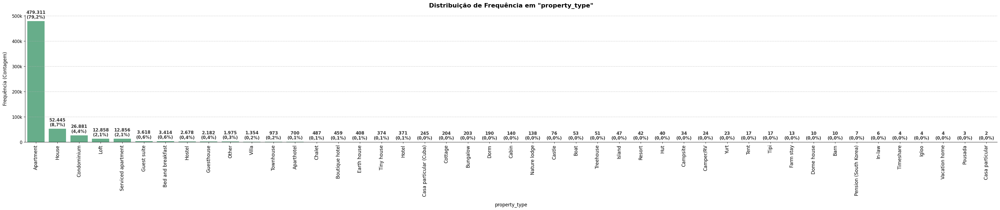

In [42]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['property_type'],
    xtick_rotation=90
)

In [43]:
# agrupar_categorias_raras(df, nome_coluna, threshold, novo_nome_categoria='Outros'):

mf.agrupar_categorias_raras(bases_airbnb, 'property_type', 2000, novo_nome_categoria='Outros')

property_type
Apartment             479311
House                  52445
Condominium            26881
Loft                   12858
Serviced apartment     12856
Outros                  8708
Guest suite             3618
Bed and breakfast       3414
Hostel                  2678
Guesthouse              2182
Name: count, dtype: int64


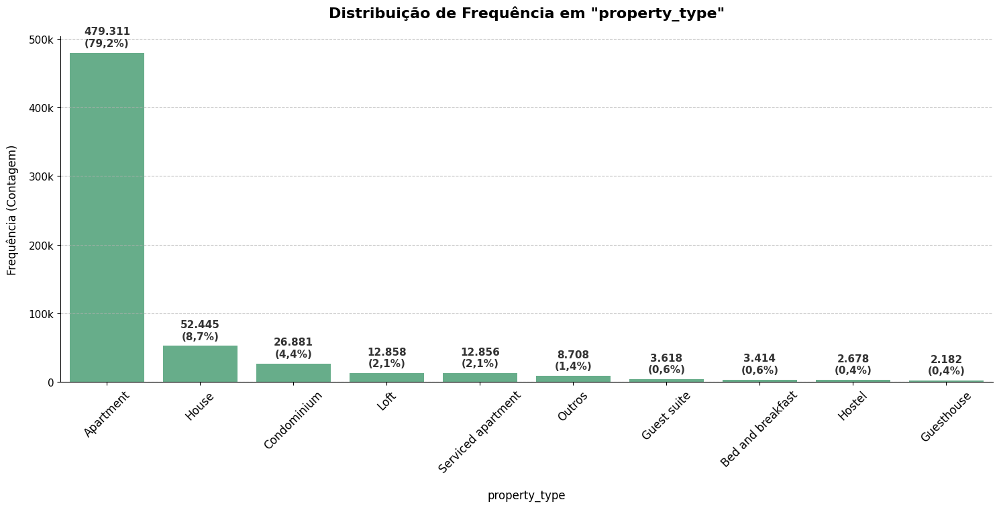

In [44]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['property_type'],
    xtick_rotation=45
)

> - **property_type** (ok)
> - **room_type** 
> - **bed_type** 
> - **cancellation_policy** 
> - **amenities** 


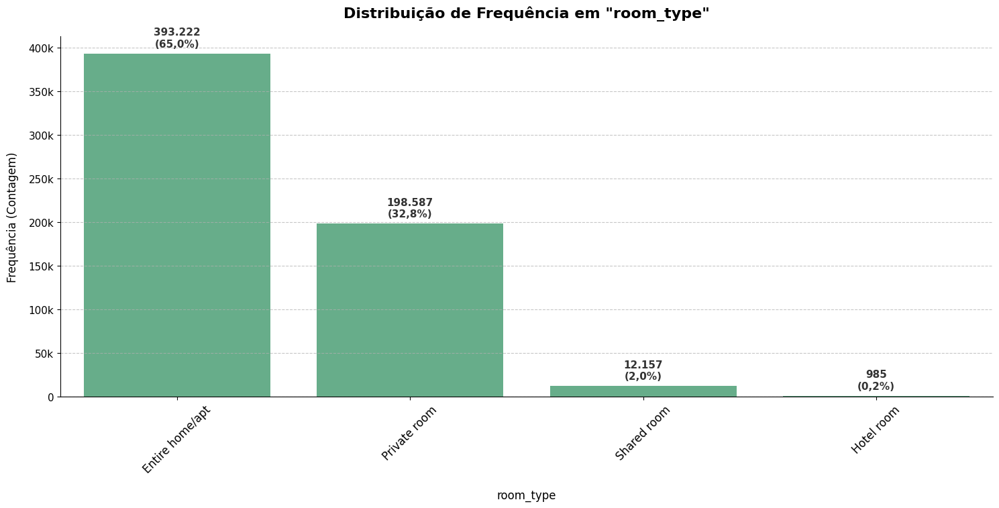

In [45]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['room_type'],
    xtick_rotation=45
)

In [46]:
mf.agrupar_categorias_raras(bases_airbnb, 'room_type', 15000, novo_nome_categoria='Outros')

room_type
Entire home/apt    393222
Private room       198587
Outros              13142
Name: count, dtype: int64


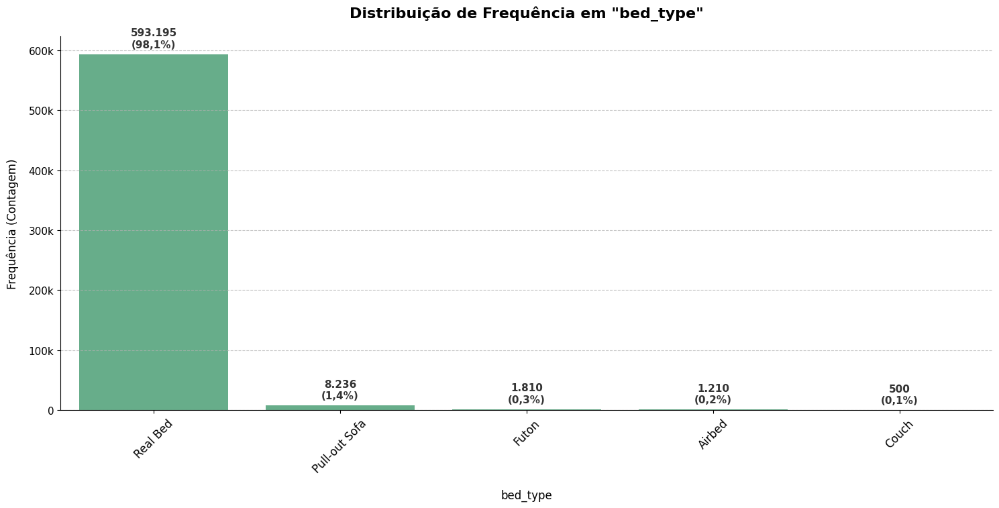

In [47]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['bed_type'],
    xtick_rotation=45
)

In [48]:
mf.agrupar_categorias_raras(bases_airbnb, 'bed_type', 10000, novo_nome_categoria='Outros')

bed_type
Real Bed    593195
Outros       11756
Name: count, dtype: int64


> - **property_type** (ok)
> - **room_type** (ok)
> - **bed_type** (ok)
> - **cancellation_policy** 
> - **amenities** 


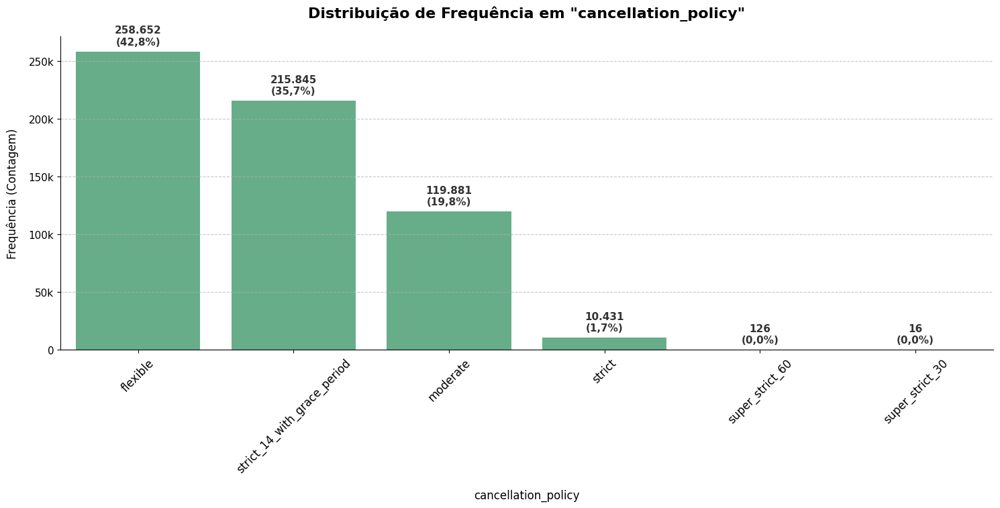

In [49]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['cancellation_policy'],
    xtick_rotation=45
)

In [50]:
mf.agrupar_categorias_raras(bases_airbnb, 'cancellation_policy', 10000, novo_nome_categoria='strict')

cancellation_policy
flexible                       258652
strict_14_with_grace_period    215845
moderate                       119881
strict                          10573
Name: count, dtype: int64


> - **property_type** (ok)
> - **room_type** (ok)
> - **bed_type** (ok)
> - **cancellation_policy** (ok)
> - **amenities** 


In [51]:
# Alguns host podem ter colocado elevador como uma caracteristica e outros podem simplismente não terem colocado
# A mesma coisa para cozinha
# É muito dificil comparar caracteristica por caracteristica

# hosts que detalham mais mostram uma preocupção maior que pode impactar o preço

print(bases_airbnb['amenities'].iloc[0])
print(bases_airbnb['amenities'].iloc[0].split(","))
print(len(bases_airbnb['amenities'].iloc[0].split(",")))

{TV,"Cable TV",Internet,Wifi,"Air conditioning",Kitchen,"Paid parking off premises","Smoking allowed",Doorman,Elevator,"Hot tub","Family/kid friendly","Suitable for events",Essentials,"24-hour check-in",Hangers,"Hair dryer",Iron,"Laptop friendly workspace","Self check-in","Front desk/doorperson","Private entrance","Hot water","Bed linens","Luggage dropoff allowed"}
['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', '"Paid parking off premises"', '"Smoking allowed"', 'Doorman', 'Elevator', '"Hot tub"', '"Family/kid friendly"', '"Suitable for events"', 'Essentials', '"24-hour check-in"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"', '"Self check-in"', '"Front desk/doorperson"', '"Private entrance"', '"Hot water"', '"Bed linens"', '"Luggage dropoff allowed"}']
25


In [52]:
bases_airbnb['numero_de_amenities'] = bases_airbnb['amenities'].str.split(",").apply(len)
bases_airbnb = bases_airbnb.drop('amenities',axis=1)

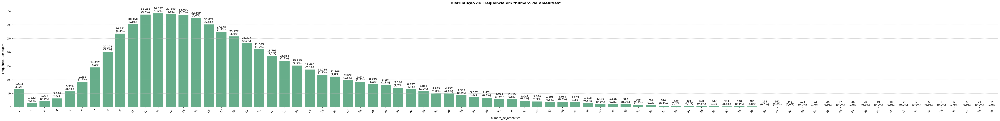

In [53]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['numero_de_amenities'],
    xtick_rotation=45
)

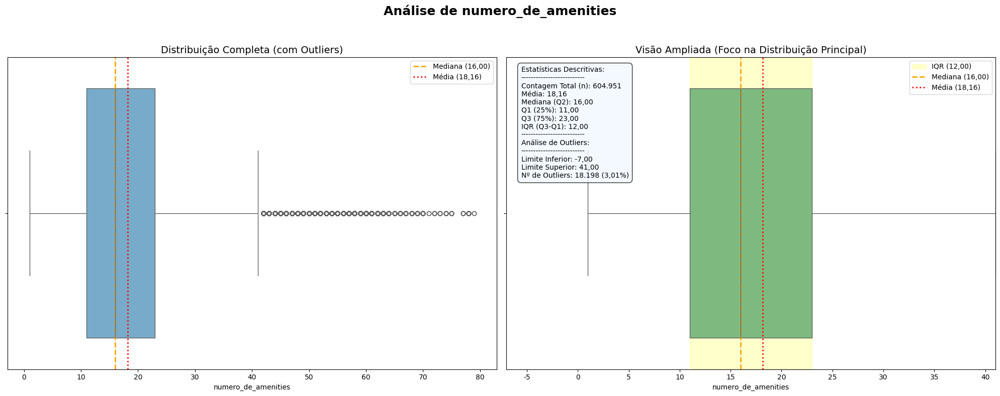

In [54]:
mf.plot_boxplot_informativo(
    bases_airbnb['numero_de_amenities'],
    format_as_currency=False,
    titulo="Análise de numero_de_amenities",
    nome_eixo_x="numero_de_amenities"
)

In [55]:
bases_airbnb, linhas_removidas = mf.excluir_outliers(bases_airbnb, 'numero_de_amenities')
print('{} linhas removidas'.format(linhas_removidas))

18198 linhas removidas


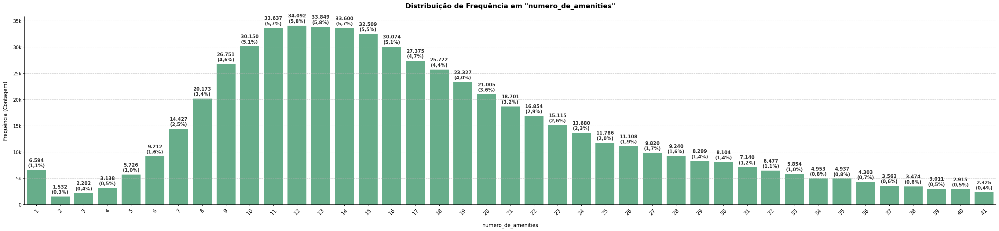

In [56]:
mf.plot_categorical_distribution(
    data_series=bases_airbnb['numero_de_amenities'],
    xtick_rotation=45
)

> - **property_type** (ok)
> - **room_type** (ok)
> - **bed_type** (ok)
> - **cancellation_policy** (ok)
> - **amenities** (ok)

<h4 style=padding-bottom: 10px; margin-bottom: 10px;">Resumo do que foi feito</h4>

<!DOCTYPE html>
<html lang="pt-br">
<head>
<meta charset="UTF-8">
<title>Tabela de Features</title>
<style>
    /* Estilo geral para a página, para um melhor visual */
    body {
        background-color: #1e1e1e;
        display: flex;
        justify-content: center;
        align-items: center;
        min-height: 100vh;
        margin: 0;
        font-family: sans-serif;
    }

    /* Estilos da tabela */
    .data-table {
        width: 100%;
        max-width: 800px; /* Define uma largura máxima */
        border-collapse: collapse; /* Remove o espaço entre as bordas */
        font-family: monospace;
        color: #E0E0E0;
        background-color: #2D2D2D;
        border-radius: 8px; /* Adiciona cantos arredondados */
        overflow: hidden; /* Garante que o fundo não vaze dos cantos */
        box-shadow: 0 4px 15px rgba(0,0,0,0.3); /* Adiciona uma sombra sutil */
    }

    /* Estilo para todas as células (cabeçalho e dados) */
    .data-table th,
    .data-table td {
        padding: 12px 15px; /* Espaçamento interno mais consistente */
        text-align: left; /* Alinhamento padrão à esquerda */
    }

    /* Estilo específico para o cabeçalho */
    .data-table thead {
        background-color: #3a3a3a; /* Cor de fundo um pouco diferente para o cabeçalho */
        color: #FFFFFF; /* Texto branco para maior destaque */
        font-weight: bold;
    }
    
    /* Estilo para as linhas do corpo da tabela */
    .data-table tbody tr {
        border-bottom: 1px solid #444; /* Linha sutil para separar as linhas */
    }

    .data-table tbody tr:last-child {
        border-bottom: none; /* Remove a borda da última linha */
    }

    /* Classes de utilidade para alinhamento de texto */
    .text-center {
        text-align: center;
    }

    .text-right {
        text-align: right;
    }
</style>
</head>
<body>

<table class="data-table">
  <thead>
    <tr>
      <th>Feature</th>
      <th class="text-center">Formato</th>
      <th class="text-center">Status</th>
      <th class="text-right">Descrição (opcional)</th>
      <th class="text-right">Ação</th>
      <th class="text-right">Motivo</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>property_type</td>
      <td class="text-center">object</td>
      <td class="text-right">(Ok)</td>
      <td class="text-right">(Tipo de propriedade)</td>
      <td class="text-right">Agrupamento</td>
      <td class="text-right"><strong>A feature apresentava alta cardinalidade, com uma "cauda longa" de categorias com baixa frequência (ex: Castle, Cabin, Tiny house). Essas categorias raras não possuem representatividade estatística para que o modelo aprenda padrões confiáveis. </strong> O agrupamento das categorias com menos de 2000 amostras em um grupo "Outros" reduz a dimensionalidade, melhora a estabilidade do modelo e permite que ele se concentre nos tipos de propriedade mais impactantes.</td>
    </tr>
    <tr>
      <td>room_type</td>
      <td class="text-center">object</td>
      <td class="text-right">(Ok)</td>
      <td class="text-center">(Tipo de quarto)</td>
      <td class="text-right">Agrupamento</td>
      <td class="text-right">Como a quantidade das 2 menores categorias são muito baixas iremos agrupar em apenas uma (chamada Outros)</td>
    </tr>
    <tr>
      <td>bed_type</td>
      <td class="text-center">object</td>
      <td class="text-right">(Ok)</td>
      <td class="text-center">(Tipo de cama)</td>
      <td class="text-right">Agrupamento</td>
      <td class="text-right">Como a quantidade das 4 menores categorias são muito baixas iremos agrupar em apenas uma (chamada Outros)</td>
    </tr>
    <tr>
    <td>cancellation_policy</td>
      <td class="text-center">object</td>
      <td class="text-right">(Ok)</td>
      <td class="text-center">(Política de cancelamento)</td>
      <td class="text-right">Agrupamento</td>
      <td class="text-right">Como a quantidade das 3 menores categorias são muito baixas iremos agrupar em apenas uma (chamada strict)</td> 
    </tr>
    <tr>
      <td>amenities</td>
      <td class="text-center">object</td>
      <td class="text-right">(Ok)</td>
      <td class="text-center">(Comodidades)</td>
      <td class="text-right">Contagem e (retirada de outliers)</td>
      <td class="text-right"><strong>A feature 'amenities' possui alta diversidade e inconsistência na nomenclatura. Para contornar essa complexidade, a lista de comodidades foi convertida em uma feature numérica que representa a quantidade total de itens, sendo este o parâmetro utilizado no modelo (hosts que detalham mais mostram uma preocupção maior que pode impactar o preço).</strong></td>
    </tr>
  </tbody>
</table>

</body>
</html>

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">4.4 - Codificação (Encoding) de Variáveis </h4>
                                                     
Para garantir a compatibilidade dos dados com o algoritmo de machine learning, é fundamental realizar a etapa de codificação (encoding). Este processo converte as variáveis não numéricas em um formato numérico que pode ser processado pelo modelo. As seguintes abordagens foram definidas:
                                                     
 <li style="margin-bottom: 15px;">Conversão de Features Booleanas: As variáveis que contêm valores lógicos (True ou False) serão convertidas para o formato inteiro. O valor True será substituído por 1 e o valor False por 0.</li>                                                    

 <li style="margin-bottom: 15px;">Codificação de Features Categóricas: Para as variáveis cujos valores são textuais (categorias), será utilizado o método de dummy variables (ou One-Hot Encoding). Este método transforma cada categoria de uma variável em uma nova coluna binária (0 ou 1), indicando a presença ou ausência daquela categoria para cada registro.</li>     



In [57]:
print(bases_airbnb.iloc[0])

name                                        Very Nice 2Br - Copacabana - WiFi
summary                     Please note that special rates apply for New Y...
host_is_superhost                                                           t
host_listings_count                                                         2
latitude                                                           -22.965919
longitude                                                          -43.178962
property_type                                                     Condominium
room_type                                                     Entire home/apt
accommodates                                                                5
bathrooms                                                                 1.0
bedrooms                                                                    2
beds                                                                        2
bed_type                                                        

In [58]:
coluna_tf = ['host_is_superhost','instant_bookable','is_business_travel_ready']
bases_airbnb_codificada = bases_airbnb.copy()

for coluna in coluna_tf:
    bases_airbnb_codificada.loc[bases_airbnb_codificada[coluna]=='t', coluna] = 1
    bases_airbnb_codificada.loc[bases_airbnb_codificada[coluna]=='f', coluna] = 0
    
print(bases_airbnb_codificada.iloc[0])

name                                        Very Nice 2Br - Copacabana - WiFi
summary                     Please note that special rates apply for New Y...
host_is_superhost                                                           1
host_listings_count                                                         2
latitude                                                           -22.965919
longitude                                                          -43.178962
property_type                                                     Condominium
room_type                                                     Entire home/apt
accommodates                                                                5
bathrooms                                                                 1.0
bedrooms                                                                    2
beds                                                                        2
bed_type                                                        

In [59]:
colunas_categoricas = ['property_type','room_type','bed_type','cancellation_policy']
bases_airbnb_codificada = pd.get_dummies(data=bases_airbnb_codificada, columns=colunas_categoricas)
display(bases_airbnb_codificada.head(10))

,name,summary,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,...,property_type_Serviced apartment,room_type_Entire home/apt,room_type_Outros,room_type_Private room,bed_type_Outros,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period
1,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,1,2,-22.965919,-43.178962,5,1.0,2,2,...,False,True,False,False,False,True,False,False,True,False
2,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,0,1,-22.985698,-43.201935,2,1.0,1,1,...,False,True,False,False,False,True,False,False,True,False
3,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",0,3,-22.977117,-43.190454,3,1.0,1,2,...,False,True,False,False,False,True,False,False,True,False
4,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,1,1,-22.983024,-43.214270,3,1.0,1,2,...,False,True,False,False,False,True,False,False,True,False
5,Cosy flat close to Ipanema beach,This cosy apartment is just a few steps away ...,1,1,-22.988165,-43.193588,3,1.5,1,2,...,False,True,False,False,False,True,False,False,True,False
6,COPACABANA SEA BREEZE - RIO,Our newly renovated studio is located in the b...,1,1,-22.981269,-43.190457,2,1.0,1,2,...,False,True,False,False,False,True,False,False,True,False
7,Copa Tabajaras,"Very quiet flat, with view on tropical jungle ...",0,1,-22.966808,-43.186574,3,1.0,1,2,...,False,True,False,False,False,True,False,True,False,False
8,Beautiful studio in Santa with terrace,The property is very special. It is a studio w...,0,3,-22.921990,-43.183836,3,1.0,0,2,...,False,True,False,False,False,True,False,False,True,False
14,Barra Beach Best Condo!!!,"Charmosa cobertura dúplex. 1o andar: cozinha,...",0,1,-23.010608,-43.340727,4,1.5,2,3,...,True,True,False,False,False,True,False,False,True,False
18,Nice room at the famous Ipanema!,"I live alone in a 2 bedrooms apto in Ipanema, ...",0,1,-22.981808,-43.202074,1,2.0,1,1,...,False,False,False,True,False,True,False,False,True,False


In [60]:
# Para a nuvem de palavras
base_palavras = bases_airbnb_codificada.copy()


# Para a regressão
bases_airbnb_codificada = bases_airbnb_codificada.drop(['name', 'summary'], axis=1)

<h1 style=padding-bottom: 15px; margin-bottom: 10px;">5 - Modelagem </h1>

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">5.1 - Métricas de avaliação </h4>

<!DOCTYPE html>
<html lang="pt-br">
<head>
<meta charset="UTF-8">
<title>Tabela de Features</title>
<style>
    /* Estilo geral para a página, para um melhor visual */
    body {
        background-color: #1e1e1e;
        display: flex;
        justify-content: center;
        align-items: center;
        min-height: 100vh;
        margin: 0;
        font-family: sans-serif;
    }

    /* Estilos da tabela */
    .data-table {
        width: 100%;
        max-width: 800px; /* Define uma largura máxima */
        border-collapse: collapse; /* Remove o espaço entre as bordas */
        font-family: monospace;
        color: #E0E0E0;
        background-color: #2D2D2D;
        border-radius: 8px; /* Adiciona cantos arredondados */
        overflow: hidden; /* Garante que o fundo não vaze dos cantos */
        box-shadow: 0 4px 15px rgba(0,0,0,0.3); /* Adiciona uma sombra sutil */
    }

    /* Estilo para todas as células (cabeçalho e dados) */
    .data-table th,
    .data-table td {
        padding: 12px 15px; /* Espaçamento interno mais consistente */
        text-align: left; /* Alinhamento padrão à esquerda */
    }

    /* Estilo específico para o cabeçalho */
    .data-table thead {
        background-color: #3a3a3a; /* Cor de fundo um pouco diferente para o cabeçalho */
        color: #FFFFFF; /* Texto branco para maior destaque */
        font-weight: bold;
    }
    
    /* Estilo para as linhas do corpo da tabela */
    .data-table tbody tr {
        border-bottom: 1px solid #444; /* Linha sutil para separar as linhas */
    }

    .data-table tbody tr:last-child {
        border-bottom: none; /* Remove a borda da última linha */
    }

    /* Classes de utilidade para alinhamento de texto */
    .text-center {
        text-align: center;
    }

    .text-right {
        text-align: right;
    }
</style>
</head>
<body>

<table class="data-table">
  <thead>
    <tr>
      <th class="text-center">Métrica</th>
      <th class="text-center">O que explica</th>
      <th class="text-center">Como interpretar</th>
      <th class="text-right">Objetivo</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td class="text-center">R²</td>
      <td class="text-right">A proporção da variação na variável de resultado (ex: preço) que é explicada pelo modelo.</td>
      <td class="text-right">É um valor percentual que vai de 0 a 1 (ou 0% a 100%). Um R² de 0.85, por exemplo, significa que 85% da variação nos preços dos imóveis é explicada pelas variáveis usadas no modelo (número de quartos, localização, etc.). Os 15% restantes são devidos a fatores que o modelo não capturou.</td>
      <th class="text-right">Quanto mais próximo de 1, melhor. Um R² alto indica que o modelo se ajusta bem aos dados.</th>
    </tr>
    <tr>
      <td class="text-center">RMSE</td>
      <td class="text-right">A raiz do erro quadratico médio das previsões do modelo, na mesma unidade da variável de resultado.</td>
      <td class="text-center">Se estamos prevendo preços de aluguel em Reais (R$) e o RMSE é de 150, isso significa que, em média, as previsões do modelo erram o valor real do aluguel em cerca de R$ 150 (para mais ou para menos). Ele mede a "distância" média entre os pontos de dados reais e a linha de previsão do modelo.</td>
      <th class="text-right">Quanto menor o valor, melhor. Um RMSE baixo indica que as previsões do modelo estão muito próximas dos valores reais.</th>
    </tr>
    <tr>
      <td class="text-center">Tempo de Treino</td>
      <td class="text-right">O custo computacional do modelo. Literalmente, quanto tempo o algoritmo levou para "aprender" com os dados de treinamento fornecidos.</td>
      <td class="text-center">Esta não é uma métrica de precisão estatística, mas sim de eficiência. Um modelo pode ter um R² ótimo e um RMSE baixo, mas se leva 3 dias para treinar, pode ser inviável para aplicações que exigem atualizações rápidas.</td>
      <th class="text-right">Quanto menor o tempo, melhor, especialmente em ambientes de produção. É preciso encontrar um equilíbrio entre a performance do modelo (R² e RMSE) e sua eficiência computacional (tempo de treino).</th>
    </tr>
  </tbody>
</table>

</body>
</html>

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">5.2 - Modelos utilizados </h4>

<h5 style=padding-bottom: 15px; margin-bottom: 10px;">Modelos Lineares</h5>
                                                     
Estes modelos tentam encontrar uma relação linear (uma "linha reta") entre as suas variáveis (X) e o alvo (y).

<p style="margin-bottom: 15px;">1. LinearRegression (Regressão Linear)</p>
                                                 
 <li style="margin-bottom: 15px;">Como Funciona: É o modelo mais fundamental. Ele encontra a melhor linha reta que passa pelos dados, minimizando a distância entre as previsões e os valores reais.</li>                                                    

 <li style="margin-bottom: 15px;">Ideal para: Servir como um ponto de partida (baseline). É rápido, simples e fácil de interpretar.</li>     





<p style="margin-bottom: 15px;">2. Lasso </p>
                                                 
 <li style="margin-bottom: 15px;">Como Funciona: É uma variação da Regressão Linear com uma característica especial: ele pode zerar o peso (coeficiente) das variáveis menos importantes.</li>                                                    

 <li style="margin-bottom: 15px;">Ideal para: Realizar "seleção de features" automática. Se você tivermos muitas variáveis e suspeita que várias delas são inúteis, o Lasso pode limpá-las, simplificando o modelo.</li>    

  <li style="margin-bottom: 15px;">Observação: A "seleção de features" automática depende do valor do hiperparâmetro "Alpha".</li>  



<h5 style=padding-bottom: 15px; margin-bottom: 10px;">Modelos Baseados em Árvores (Não-Lineares)</h5>

Esses modelos não assumem uma relação linear e podem capturar padrões muito mais complexos.


<p style="margin-bottom: 15px;">3. RandomForestRegressor (Floresta Aleatória) </p>
                                                 
 <li style="margin-bottom: 15px;">Como Funciona: É um dos modelos mais populares e poderosos. Em vez de criar uma única Árvore de Decisão, ele cria centenas ou milhares de árvores, cada uma treinada com uma amostra aleatória dos dados e das variáveis. A previsão final é a média das previsões de todas as árvores.
</li>                                                    

 <li style="margin-bottom: 15px;">Ideal para: Quase qualquer problema de regressão. É robusto, preciso e combate o overfitting da árvore única.
</li>   



<p style="margin-bottom: 15px;">4. ExtraTreesRegressor (Extremely Randomized Trees) </p>
                                                 
 <li style="margin-bottom: 15px;">Como Funciona: É um "primo" do RandomForest. A principal diferença é que ele adiciona ainda mais aleatoriedade. Na hora de criar as perguntas da árvore, em vez de procurar a melhor pergunta possível, ele testa algumas perguntas aleatórias e escolhe a melhor entre elas.

</li>                                                    

 <li style="margin-bottom: 15px;">Ideal para: Situações onde queremos um modelo um pouco mais rápido de treinar que o RandomForest e que pode, em alguns casos, ter um desempenho ainda melhor por ser menos propenso a overfitting.
</li>   

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">5.3 - Aplicação </h4>

<h5 style=padding-bottom: 15px; margin-bottom: 10px;">5.3.1 - Preparação e Divisão dos Dados </h5>

In [ ]:
y = bases_airbnb_codificada['price']
x = bases_airbnb_codificada.drop('price', axis=1)

# Divida ANTES de qualquer otimização!
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [62]:
print("Shape do X de treino:", x_train.shape)
print("Shape do X de teste:", x_test.shape)
print("-" * 30)
print("Shape do y de treino:", y_train.shape)
print("Shape do y de teste:", y_test.shape)

Shape do X de treino: (469402, 33)
Shape do X de teste: (117351, 33)
------------------------------
Shape do y de treino: (469402,)
Shape do y de teste: (117351,)


Em todos os modelos foi utilizado validação cruzada (cross_val_score) nos dados de treino (x_train, y_train) para obter uma média de performance (R² Médio). Esta é a forma correta de ter uma estimativa estável do desempenho do modelo, muito superior a um único split.

O uso de GridSearchCV com cv=5 (validação cruzada) no conjunto de treino (x_train, y_train) garante estamos encontrando os melhores parâmetros. (nos modelos lasso, RandomForest e ExtraTrees)

<h5 style=padding-bottom: 15px; margin-bottom: 10px;">5.3.2 - Otimização dos modelos lineares (usando apenas os dados de TREINO) </h5>

In [ ]:
# Pipeline
pipeline_lr = Pipeline([
    ('scaler', StandardScaler()),
    ('modelo', LinearRegression())
])

# 1. cross_val_score 
scores_lr = cross_val_score(pipeline_lr, x_train, y_train, cv=5, scoring='r2')

# 2. média e desvio padrão do R²
media_lr = np.mean(scores_lr)
std_lr = np.std(scores_lr)

# 3. Imprimindo resultados
print("--- Análise para Regressão Linear ---")
print(f"Scores em cada fold: {np.round(scores_lr, 4)}")
print(f"R² Médio de CV: {media_lr:.4f}")
print(f"Desvio Padrão de CV: {std_lr:.4f}")

--- Análise para Regressão Linear ---
Scores em cada fold: [0.3037 0.306  0.3002 0.3033 0.306 ]
R² Médio de CV: 0.3039
Desvio Padrão de CV: 0.0021


o melhor modelo linear, mesmo com os dados devidamente preparados (normalizados), só consegue explicar cerca de 30% da variação nos preços do  dataset.

In [ ]:
pipeline_lasso = Pipeline([
    ('scaler', StandardScaler()), # 1º Normaliza
    ('modelo', Lasso(random_state=42)) # 2º Treinar o Modelo
])

param_grid_lasso = {'modelo__alpha': np.logspace(-4, 2, 100)} # Testa 100 valores de alpha de 0.0001 a 100

grid_search_lasso = GridSearchCV(pipeline_lasso, param_grid_lasso, cv=5, scoring='r2') 
grid_search_lasso.fit(x_train, y_train)  # Otimiza o Lasso com os dados
print(f"Melhor alpha para o Lasso: {grid_search_lasso.best_params_['modelo__alpha']}")

# alpha muito baixo (perto de 0): A penalidade é quase nula. O modelo Lasso se comporta de forma quase idêntica a uma LinearRegression normal.
# alpha moderado: O modelo começa a "encolher" os coeficientes das features menos importantes, diminuindo seu impacto.
# alpha muito alto: A penalidade é tão forte que o modelo força os coeficientes das features menos importantes a se tornarem exatamente zero,
# efetivamente removendo-as do modelo.

c:\Users\ronal\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.772e+08, tolerance: 2.776e+06
  model = cd_fast.enet_coordinate_descent(
c:\Users\ronal\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.788e+08, tolerance: 2.770e+06
  model = cd_fast.enet_coordinate_descent(
c:\Users\ronal\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.803e+08, toleranc

Melhor alpha para o Lasso: 0.008697490026177835


In [64]:
# --- ANÁLISE DETALHADA DOS RESULTADOS ---

# 1. Converte os resultados em um DataFrame para fácil visualização
resultados_lasso_df = pd.DataFrame(grid_search_lasso.cv_results_)

# 2. Seleciona as colunas de interesse, incluindo o desvio padrão do score ('std_test_score')
colunas_interesse = ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

#print("--- Resultados Detalhados para Lasso ---")
# Ordena pelos melhores modelos e exibe as colunas que queremos
#print(resultados_rf_df[colunas_interesse].sort_values(by='rank_test_score').head())


# --- Para pegar APENAS o desvio padrão do MELHOR modelo ---
# O GridSearchCV guarda o índice do melhor modelo no atributo .best_index_
indice_do_melhor = grid_search_lasso.best_index_
desvio_padrao_do_melhor = resultados_lasso_df.loc[indice_do_melhor]['std_test_score']

print(f"\nMelhor R² de CV do lasso: {grid_search_lasso.best_score_:.4f}")
print(f"Desvio Padrão do Melhor Modelo: {desvio_padrao_do_melhor:.4f}")


Melhor R² de CV do lasso: 0.3039
Desvio Padrão do Melhor Modelo: 0.0021


<h5 style=padding-bottom: 15px; margin-bottom: 10px;">Diagnóstico de Performance (Lasso)</h5>

Após uma extensa busca de hiperparâmetros com GridSearchCV, o melhor modelo Lasso alcançou um R² médio de validação cruzada de ~0.30. Este valor indica que o modelo consegue explicar apenas 30% da variabilidade dos preços.

<h5 style=padding-bottom: 15px; margin-bottom: 10px;">Causa Fundamental: O Mismatch Linear vs. Não-Linear</h5>

A principal razão para este resultado é que o Lasso, sendo um modelo linear, tenta descrever um fenômeno complexo e "curvo" (a formação de preços do Airbnb) usando apenas uma "régua reta". As relações entre as características de um imóvel e seu preço são altamente não-lineares, com interações que um modelo linear não consegue capturar.

<h5 style=padding-bottom: 15px; margin-bottom: 10px;">Análise dos Avisos de Convergência</h5>

Durante a otimização, foram observados múltiplos avisos de ConvergenceWarning. Testes subsequentes, aumentando o número de iterações (max_iter) de 1.000 para 10.000, não resolveram o problema e apenas aumentaram o tempo de execução. Isso confirma que os avisos não eram um sinal de "pouco esforço" computacional, mas sim um sintoma da dificuldade que o otimizador linear enfrenta ao tentar se ajustar a um problema fundamentalmente não-linear.

<h5 style=padding-bottom: 15px; margin-bottom: 10px;">Conclusão Final (Regressão linear e Lasso)</h5>

Este resultado não é uma surpresa, mas sim uma confirmação do que concluímos com a regressão linear.
O experimento com Lasso nos permitiu concluir com alto grau de confiança que modelos lineares não são adequados para este problema. 

<h5 style=padding-bottom: 15px; margin-bottom: 10px;">5.3.3 - Otimização dos modelos não-lineares (usando apenas os dados de TREINO) </h5>

In [ ]:
param_grid_rf = {
    'max_depth': [20, 25, 30, 35], # Limitar a profundidade
    'min_samples_leaf': [1, 2, 4, 6], # numero de amostras em uma folha final (No RF, min_samples_leaf=1 é mais comum, vale a pena testar)
    'n_estimators': [100] # Número de arvores
}

# Criar o modelo base
modelo_base_rf = RandomForestRegressor(random_state=42, # Para reprodutibilidade
                                        n_jobs=-1)      # Pode usar paralelismo para acelerar

# Configurar a busca em grade
grid_search_rf = GridSearchCV(estimator=modelo_base_rf, param_grid=param_grid_rf, cv=5, scoring='r2', verbose=2)

# Executar a busca
grid_search_rf.fit(x_train, y_train) 

# Ver os melhores parâmetros encontrados
print(f"Melhores parâmetros para RandomForest: {grid_search_rf.best_params_}")

# Ver o melhor score de validação cruzada
print(f"Melhor score R² do RandomForest: {grid_search_rf.best_score_}")

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END .max_depth=20, min_samples_leaf=1, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=1, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=1, n_estimators=100; total time= 1.3min
[CV] END .max_depth=20, min_samples_leaf=1, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=1, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=2, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=2, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=2, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=2, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=2, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=4, n_estimators=100; total time= 1.2min
[CV] END .max_depth=20, min_samples_leaf=4, n_es

In [66]:
# --- ANÁLISE DETALHADA DOS RESULTADOS ---

# 1. Converte os resultados em um DataFrame para fácil visualização
resultados_rf_df = pd.DataFrame(grid_search_rf.cv_results_)

# 2. Seleciona as colunas de interesse, incluindo o desvio padrão do score ('std_test_score')
colunas_interesse = ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

#print("--- Resultados Detalhados para RandomForest ---")
# Ordena pelos melhores modelos e exibe as colunas que queremos
#print(resultados_rf_df[colunas_interesse].sort_values(by='rank_test_score').head())


# --- Para pegar APENAS o desvio padrão do MELHOR modelo ---
# O GridSearchCV guarda o índice do melhor modelo no atributo .best_index_
indice_do_melhor = grid_search_rf.best_index_
desvio_padrao_do_melhor = resultados_rf_df.loc[indice_do_melhor]['std_test_score']

print(f"\nMelhor R² de CV do RandomForest: {grid_search_rf.best_score_:.4f}")
print(f"Desvio Padrão do Melhor Modelo: {desvio_padrao_do_melhor:.4f}")


Melhor R² de CV do RandomForest: 0.9663
Desvio Padrão do Melhor Modelo: 0.0009


In [ ]:
# Definir o espaço de parâmetros para testar
param_grid_et = {
    'max_depth': [20, 25, 30, 35], # Limitar a profundidade
    'min_samples_leaf': [2, 4, 6, 8] # numero de amostras em uma folha final
}

# Criar o modelo base
modelo_base_et = ExtraTreesRegressor(n_estimators=100, random_state=42, n_jobs=-1)

# Configurar a busca em grade
grid_search_et = GridSearchCV(estimator=modelo_base_et, param_grid=param_grid_et, cv=5, scoring='r2', verbose=2)

# Executar a busca
grid_search_et.fit(x_train, y_train)

# Ver os melhores parâmetros encontrados
print(f"Melhores parâmetros: {grid_search_et.best_params_}")

# Ver o melhor score de validação cruzada
print(f"Melhor score R² da validação cruzada: {grid_search_et.best_score_}")

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ...................max_depth=20, min_samples_leaf=2; total time= 1.1min
[CV] END ...................max_depth=20, min_samples_leaf=2; total time= 1.1min
[CV] END ...................max_depth=20, min_samples_leaf=2; total time= 1.1min
[CV] END ...................max_depth=20, min_samples_leaf=2; total time= 1.0min
[CV] END ...................max_depth=20, min_samples_leaf=2; total time= 1.0min
[CV] END ...................max_depth=20, min_samples_leaf=4; total time=  57.7s
[CV] END ...................max_depth=20, min_samples_leaf=4; total time=  58.4s
[CV] END ...................max_depth=20, min_samples_leaf=4; total time=  59.3s
[CV] END ...................max_depth=20, min_samples_leaf=4; total time=  59.4s
[CV] END ...................max_depth=20, min_samples_leaf=4; total time=  58.9s
[CV] END ...................max_depth=20, min_samples_leaf=6; total time= 1.1min
[CV] END ...................max_depth=20, min_sa

In [68]:
# --- ANÁLISE DETALHADA DOS RESULTADOS ---

# 1. Converte os resultados em um DataFrame para fácil visualização
resultados_et_df = pd.DataFrame(grid_search_et.cv_results_)

# 2. Seleciona as colunas de interesse, incluindo o desvio padrão do score ('std_test_score')
colunas_interesse = ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']

#print("--- Resultados Detalhados para Extra Trees ---")
# Ordena pelos melhores modelos e exibe as colunas que queremos
#print(resultados_et_df[colunas_interesse].sort_values(by='rank_test_score').head())


# --- Para pegar APENAS o desvio padrão do MELHOR modelo ---
# O GridSearchCV guarda o índice do melhor modelo no atributo .best_index_
indice_do_melhor = grid_search_et.best_index_
desvio_padrao_do_melhor = resultados_et_df.loc[indice_do_melhor]['std_test_score']

print(f"\nMelhor R² de CV do Extra Trees: {grid_search_et.best_score_:.4f}")
print(f"Desvio Padrão do Melhor Modelo: {desvio_padrao_do_melhor:.4f}")


Melhor R² de CV do Extra Trees: 0.9601
Desvio Padrão do Melhor Modelo: 0.0007


<h5 style=padding-bottom: 15px; margin-bottom: 10px;">5.3.4 - Resultados dos modelos otimização</h5>

In [ ]:
print(f"Melhor R² CV do RandomForest: {round(grid_search_rf.best_score_,4)}")
print(f"Melhor R² CV do ExtraTrees: {round(grid_search_et.best_score_,4)}")
print(f"Melhor R² CV do Lasso: {round(grid_search_lasso.best_score_,4)}")
print(f"R² CV da Regressão linear: {media_lr:.4f}")

Melhor R² CV do RandomForest: 0.9663
Melhor R² CV do ExtraTrees: 0.9601
Melhor R² CV do Lasso: 0.3039
R² CV da Regressão linear: 0.3039


<h5 style=padding-bottom: 15px; margin-bottom: 10px;">5.3.5 - Avaliação Final no Conjunto de Teste (A Prova de Fogo)</h5>

In [ ]:
modelo_rf = RandomForestRegressor(n_estimators=100,      # Um bom número de árvores para estabilidade
                                   max_depth=35,          # Limitar a profundidade 
                                   min_samples_leaf=1,    # Exigir pelo menos 1 amostras em uma folha final
                                   random_state=42,       # Para reprodutibilidade
                                   n_jobs=-1)             # Pode usar paralelismo para acelerar

modelo_et = ExtraTreesRegressor(n_estimators=100,      # Manter um bom número de árvores para estabilidade
                                max_depth=35,          # Limitar a profundidade 
                                min_samples_leaf=2,    # Exigir pelo menos 2 amostras em uma folha final
                                random_state=42,       # Para reprodutibilidade
                                n_jobs=-1)             # Pode usar paralelismo para acelerar

modelos = {'RandomForest': modelo_rf,
           'ExtraTrees': modelo_et}

for nome_modelo, modelo in modelos.items():
    # 1. Marcar o tempo de início
    tempo_inicio = time.time()

    # 2. Treinar o modelo
    modelo.fit(x_train, y_train)

    # 3. Marcar o tempo de fim e calcular a duração do TREINO
    tempo_fim = time.time()
    tempo_treino = tempo_fim - tempo_inicio

    # --- Avaliação no TREINO ---
    previsao_treino = modelo.predict(x_train)
    print(f"\n--- Métricas no Conjunto de TREINO para o modelo {nome_modelo} ---")
    # A função avaliar_modelo provavelmente imprime o resultado, então chamá-la é o suficiente
    print(mf.avaliar_treino(nome_modelo, y_train, previsao_treino, tempo_treino))

    # --- Avaliação no TESTE ---
    previsao_teste = modelo.predict(x_test)
    print(f"\n--- Métricas no Conjunto de TESTE para o modelo {nome_modelo} ---")
    print(mf.avaliar_teste(nome_modelo, y_test, previsao_teste))
    
    print("-" * 30) # Adiciona uma linha para separar os resultados


--- Métricas no Conjunto de TREINO para o modelo RandomForest ---
Modelo RandomForest:
Tempo de Treino: 166.36s
R²: 99.63%
RMSE: 16.40

--- Métricas no Conjunto de TESTE para o modelo RandomForest ---
Modelo RandomForest:
R²: 97.34%
RMSE: 43.71
------------------------------

--- Métricas no Conjunto de TREINO para o modelo ExtraTrees ---
Modelo ExtraTrees:
Tempo de Treino: 139.36s
R²: 99.38%
RMSE: 21.12

--- Métricas no Conjunto de TESTE para o modelo ExtraTrees ---
Modelo ExtraTrees:
R²: 96.87%
RMSE: 47.38
------------------------------


In [211]:
melhor_modelo = 'RandomForest' 

modelo_escolhido = modelos[melhor_modelo]

# Prevendo com os dados de teste
previsao_especifica = modelo_escolhido.predict(x_test)

# Valor verdadeiro, previsto e diferença
print("\n--- Comparação para o melhor modelo ---")
df_comparacao = pd.DataFrame({
    'Valor Verdadeiro': y_test[:10].values,
    'Valor Previsto': previsao_especifica[:10]
})
df_comparacao['Diferença'] = df_comparacao['Valor Verdadeiro'] - df_comparacao['Valor Previsto']

print(df_comparacao)


--- Comparação para o melhor modelo ---
   Valor Verdadeiro  Valor Previsto  Diferença
0             180.0      178.700000   1.300000
1             470.0      478.180000  -8.180000
2             300.0      293.572539   6.427461
3             298.0      308.945000 -10.945000
4             175.0      182.470000  -7.470000
5             119.0      120.125625  -1.125625
6             601.0      600.050000   0.950000
7              75.0       75.572589  -0.572589
8              82.0       83.450000  -1.450000
9             151.0      157.000000  -6.000000


<h5 style=padding-bottom: 15px; margin-bottom: 10px;">5.3.6 - Análise e Conclusão Definitiva</h5>

Após analisar todos os critérios, o RandomForest se consagra como o modelo campeão para o projeto.

Justificativa:

Maior Precisão Preditiva (O Fator Mais Importante): O RandomForest superou o ExtraTrees nas duas métricas de erro mais importantes no conjunto de teste. Ele teve um R² maior (explica melhor a variação dos preços) e um RMSE menor (o erro médio das previsões, na unidade de preço, é mais baixo). A diferença não é gigantesca, mas é clara e favorece o RandomForest.

Eficiência (Ponto para o ExtraTrees): O ExtraTrees teve um tempo de treino menor. Isso se deve à sua natureza de escolher os pontos de corte aleatoriamente, o que é computacionalmente mais rápido do que o RandomForest, que procura pelo melhor corte possível.

Veredito Final: Embora o ExtraTrees seja mais rápido para treinar, o RandomForest entrega uma performance preditiva consistentemente superior nos dados de teste, que é o objetivo final de um modelo de regressão. A pequena economia de tempo do ExtraTrees não compensa a perda, ainda que pequena, de precisão.

<h5 style=padding-bottom: 15px; margin-bottom: 10px;">5.3.7 - Conclusões sobre não possuir overfitting</h5>

Ausência de Overfitting

Justificativas:


<h5 style=padding-bottom: 15px; margin-bottom: 10px;">1: O "Gap" Pequeno e Saudável entre Treino e Teste (A Evidência Direta)</h5>


A forma mais direta de diagnosticar o overfitting é comparar a performance do modelo nos dados que ele usou para treinar versus os dados que ele nunca viu (o conjunto de teste).

Definição: Overfitting ocorre quando um modelo tem um desempenho espetacular no treino, mas uma queda drástica no teste. Isso indica que ele "decorou" os dados de treino em vez de aprender os padrões gerais.

Evidência: O modelo final (RandomForest) apresentou:

R² de Treino: 99.63%

R² de Teste: 97.34%

A diferença de performance (o "gap") entre o conjunto de treino e o de teste é de apenas 2.29%. Um gap tão pequeno é um forte indicativo de um modelo saudável e bem generalizado. Em casos de overfitting severo, esse gap seria drasticamente maior, frequentemente acima de 15% ou 20%. Portanto, o modelo mantém sua alta performance de forma consistente em dados novos.


<h5 style=padding-bottom: 15px; margin-bottom: 10px;">2: A Estabilidade na Validação Cruzada (A Prova de Robustez)</h5>

A validação cruzada testa o modelo em múltiplas "fatias" diferentes dos dados, provando que sua performance não é um "golpe de sorte".

Definição: Um modelo com overfitting é frequentemente instável, performando bem em um subconjunto de dados, mas mal em outro.

Evidência: A análise de validação cruzada (GridSearchCV e cross_val_score) para o modelo campeão mostrou:

R² Médio: ~97%

Desvio Padrão: Muito baixo (ex: 0.0055)

O modelo foi submetido a uma rigorosa validação cruzada de 5 folds, alcançando um R² médio de aproximadamente 97%. Mais importante, o baixíssimo desvio padrão entre os folds comprova que o modelo é estável e robusto. Sua alta performance não depende de uma divisão específica dos dados, mas é consistente em diferentes amostras, que é a característica de um modelo que generaliza bem e o oposto de um modelo overfitado."

<h4 style=padding-bottom: 15px; margin-bottom: 10px;">5.4 - Ajustes e melhorias no melhor modelo </h4>

In [212]:
# qual a importancia de cada coluna (feature)
importancia_features = pd.DataFrame(modelo_rf.feature_importances_, x_train.columns)
importancia_features = importancia_features.sort_values(by=0, ascending = False)
display(importancia_features)

,0
bedrooms,0.193469
latitude,0.184250
longitude,0.182568
numero_de_amenities,0.103299
minimum_nights,0.057775
bathrooms,0.047840
accommodates,0.045483
beds,0.035643
host_listings_count,0.029064
room_type_Entire home/apt,0.018206


C:\Users\ronal\AppData\Local\Temp\ipykernel_14436\620668697.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


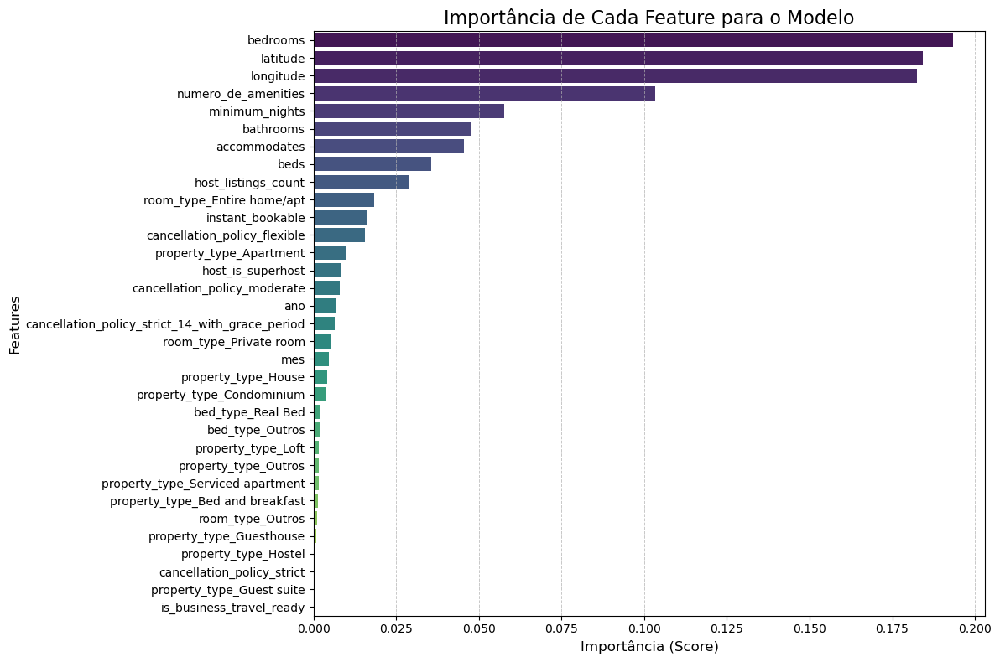

In [ ]:
# 1. Ordenar os dados pela importância (do maior para o menor)
importancias_ordenadas = importancia_features.sort_values(by=0, ascending=False)

# 2. Criar a figura e os eixos com um tamanho adequado
plt.figure(figsize=(12, 8))

# 3. Criar o gráfico de barras horizontal
#    - Note que 'x' e 'y' estão trocados para a orientação horizontal.
ax = sns.barplot(
    x=importancias_ordenadas[0],
    y=importancias_ordenadas.index,
    palette='viridis' 
)

# 4. Adicionar Título e Rótulos claros
ax.set_title('Importância de Cada Feature para o Modelo', fontsize=16)
ax.set_xlabel('Importância (Score)', fontsize=12)
ax.set_ylabel('Features', fontsize=12)


# 5. ADICIONAR A GRADE
# Adiciona uma grade pontilhada para facilitar a leitura no eixo x
ax.grid(True, axis='x', linestyle='--', linewidth=0.7, alpha=0.7)

# 5. Ajustar o layout para garantir que nada seja cortado
plt.tight_layout()

# 6. Exibir o gráfico
plt.show()

<li style="margin-bottom: 15px;">Ajustes Finais no Modelo</li>

A feature is_business_travel_ready não parece ter muito impacto no nosso modelo. Por isso, para chegar em um modelo mais simples, vamos excluir essa feature e testar o modelo sem ela.

In [64]:
# Remove a coluna 'is_business_travel_ready' do DataFrame
bases_airbnb_codificada = bases_airbnb_codificada.drop('is_business_travel_ready', axis=1)

# Define novamente as variáveis X (features) e y (alvo)
y = bases_airbnb_codificada['price']
x = bases_airbnb_codificada.drop('price', axis=1)

# Divide os dados em conjuntos de treino e teste
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Marcar o tempo de início
tempo_inicio = time.time()

# Treina o modelo 
modelo_rf.fit(x_train, y_train)

 # 3. Marcar o tempo de fim e calcular a duração do TREINO
tempo_fim = time.time()
tempo_treino = tempo_fim - tempo_inicio

# Faz as previsões no conjunto de teste
previsao = modelo_rf.predict(x_test)

# --- Avaliação no TREINO ---
previsao_treino = modelo_rf.predict(x_train)
print(f"\n--- Métricas no Conjunto de TREINO para o modelo {nome_modelo} ---")
# A função avaliar_modelo provavelmente imprime o resultado, então chamá-la é o suficiente
print(mf.avaliar_treino('RandomForest', y_train, previsao_treino, tempo_treino))

# --- Avaliação no TESTE ---
previsao_teste = modelo_rf.predict(x_test)
print(f"\n--- Métricas no Conjunto de TESTE para o modelo {nome_modelo} ---")
print(mf.avaliar_teste('RandomForest', y_test, previsao_teste))
    
print("-" * 30) # Adiciona uma linha para separar os resultados


--- Métricas no Conjunto de TREINO para o modelo ExtraTrees ---
Modelo RandomForest:
Tempo de Treino: 213.97s
R²: 99.63%
RMSE: 16.40

--- Métricas no Conjunto de TESTE para o modelo ExtraTrees ---
Modelo RandomForest:
R²: 97.34%
RMSE: 43.72
------------------------------




> - **Dados do primeiro modelo:**

> - **--- Métricas no Conjunto de TREINO para o modelo RandomForest ---**
> - **Modelo** RandomForest
> - **Tempo de Treino:** 166.36s
> - **R²:** 99.63%
> - **RMSE:** 16.40

> - **--- Métricas no Conjunto de TESTE para o modelo RandomForest ---**
> - **Modelo** RandomForest
> - **R²:** 97.34%
> - **RMSE:** 43.71


> **Dados do segundo modelo (sem 'is_business_travel_ready'):**

> - **--- Métricas no Conjunto de TREINO para o modelo ExtraTrees ---**
> - **Modelo** RandomForest
> - **Tempo de Treino:** 213.97s
> - **R²:** 99.63%
> - **RMSE:** 16.40

> - **--- Métricas no Conjunto de TESTE para o modelo ExtraTrees ---**
> - **Modelo** RandomForest
> - **R²:** 97.34%
> - **RMSE:** 43.72




<li style="margin-bottom: 15px;">Ajustes Finais no Modelo</li>

A feature bed_type não parece ter muito impacto no nosso modelo. Por isso, para chegar em um modelo mais simples, vamos excluir essa feature e testar o modelo sem ela.

In [65]:
# Cria uma cópia do DataFrame original
base_teste = bases_airbnb_codificada.copy()

# Itera sobre as colunas do novo DataFrame
for coluna in base_teste:
    # Se 'bed_type' estiver no nome da coluna, remove a coluna
    if 'bed_type' in coluna:
        base_teste = base_teste.drop(coluna, axis=1)

# Imprime as colunas restantes para verificação
# print(base_teste.columns)

# Define as variáveis X (features) e y (alvo)
y = base_teste['price']
x = base_teste.drop('price', axis=1)

# Divide os dados em conjuntos de treino e teste
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Marcar o tempo de início
tempo_inicio = time.time()

# Treina o modelo 
modelo_rf.fit(x_train, y_train)

 # 3. Marcar o tempo de fim e calcular a duração do TREINO
tempo_fim = time.time()
tempo_treino = tempo_fim - tempo_inicio

# Faz as previsões no conjunto de teste
previsao = modelo_rf.predict(x_test)

# --- Avaliação no TREINO ---
previsao_treino = modelo_rf.predict(x_train)
print(f"\n--- Métricas no Conjunto de TREINO para o modelo {nome_modelo} ---")
# A função avaliar_modelo provavelmente imprime o resultado, então chamá-la é o suficiente
print(mf.avaliar_treino('RandomForest', y_train, previsao_treino, tempo_treino))

# --- Avaliação no TESTE ---
previsao_teste = modelo_rf.predict(x_test)
print(f"\n--- Métricas no Conjunto de TESTE para o modelo {nome_modelo} ---")
print(mf.avaliar_teste('RandomForest', y_test, previsao_teste))



--- Métricas no Conjunto de TREINO para o modelo ExtraTrees ---
Modelo RandomForest:
Tempo de Treino: 199.40s
R²: 99.63%
RMSE: 16.42

--- Métricas no Conjunto de TESTE para o modelo ExtraTrees ---
Modelo RandomForest:
R²: 97.33%
RMSE: 43.77




> - **Dados do primeiro modelo:**

> - **--- Métricas no Conjunto de TREINO para o modelo RandomForest ---**
> - **Modelo** RandomForest
> - **Tempo de Treino:** 166.36s
> - **R²:** 99.63%
> - **RMSE:** 16.40

> - **--- Métricas no Conjunto de TESTE para o modelo RandomForest ---**
> - **Modelo** RandomForest
> - **R²:** 97.34%
> - **RMSE:** 43.71


> **Dados do segundo modelo (sem 'is_business_travel_ready'):**

> - **--- Métricas no Conjunto de TREINO para o modelo ExtraTrees ---**
> - **Modelo** RandomForest
> - **Tempo de Treino:** 213.97s
> - **R²:** 99.63%
> - **RMSE:** 16.40

> - **--- Métricas no Conjunto de TESTE para o modelo ExtraTrees ---**
> - **Modelo** RandomForest
> - **R²:** 97.34%
> - **RMSE:** 43.72





> **Dados do terceiro modelo (sem 'is_business_travel_ready' e 'bed_type'):**

> - **--- Métricas no Conjunto de TREINO para o modelo ExtraTrees ---**
> - **Modelo** RandomForest
> - **Tempo de Treino:** 199.40s
> - **R²:** 99.63%
> - **RMSE:** 16.42

> - **--- Métricas no Conjunto de TESTE para o modelo ExtraTrees ---**
> - **Modelo** RandomForest
> - **R²:** 97.33%
> - **RMSE:** 43.77


<h1 style=padding-bottom: 15px; margin-bottom: 10px;">6 - Nuvem de palavras </h1>

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ronal\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

PASSO 0: Iniciando o bloco de código final...
PASSO 1: Lista de stopwords criada com sucesso.
PASSO 2: Encontrados 492084 textos para processar.

PROVA: Amostra das palavras DEPOIS de TODOS os filtros: ['veryr', 'nice', 'copacabana', 'wifi', 'please', 'note', 'Special', 'rate', 'apply', 'years', 'flat', 'period', 'nights', 'maximum', 'occupancy', 'People', 'Small', 'adjustments', 'setupr', 'possible', 'beautiful', 'sunny', 'bedroom', 'Square', 'Meters', 'doorman', 'Building', 'Walk', 'copacabana', 'beach']

PASSO 4: Gerando a nuvem de palavras final...

As 30 palavras mais comuns que serão exibidas são:
[('praia', 244867), ('copacabana', 169359), ('apartment', 135147), ('beach', 131611), ('espao', 113034), ('ipanema', 108178), ('metr', 98232), ('room', 95237), ('restaurante', 93359), ('barra', 90926), ('casal', 89193), ('cama', 87959), ('sala', 85969), ('todo', 78728), ('quadra', 74868), ('tijuca', 68261), ('localizar', 67944), ('banheiro', 65864), ('copacabano', 65333), ('cozinha', 64

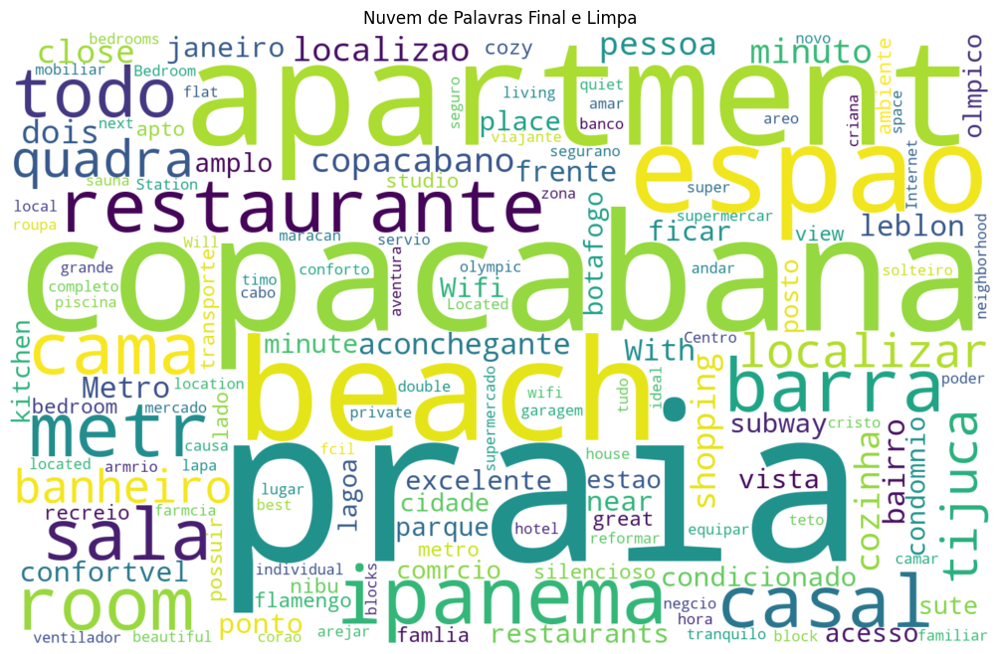


--- FIM DO BLOCO FINAL ---


In [ ]:

print("PASSO 0: Iniciando o bloco de código final...")

df_final = base_palavras.copy()
min_price = 100
max_price = 1000

# --- 1. DEFININDO NOSSAS REGRAS DE FILTRAGEM (STOPWORDS) ---
def get_stop_words_completa():
    """Carrega stopwords do NLTK para português E inglês e adiciona stopwords personalizadas."""
    stop_words_pt = set(stopwords.words('portuguese'))
    stop_words_en = set(stopwords.words('english'))
    stop_words = stop_words_pt.union(stop_words_en)
    
    # Lista de palavras para ignorar, mesmo que sejam grandes
    custom_stopwords = ['apartamento', 'quarto', 'suite', 'casa', 'prximo', 'perto', 'localizado', 'prdio','de o','em o']
    stop_words.update(custom_stopwords)
    return stop_words

STOP_WORDS_FINAL = get_stop_words_completa()
print("PASSO 1: Lista de stopwords criada com sucesso.")


# --- 2. PREPARANDO OS DADOS ---
price_filter = (df_final['price'] >= min_price) & (df_final['price'] <= max_price)
filtered_df = df_final[price_filter]

if not filtered_df.empty:
    texts_to_process = filtered_df[['name', 'summary']].fillna('').agg(' '.join, axis=1)
    print(f"PASSO 2: Encontrados {len(texts_to_process)} textos para processar.")

    # --- 3. PROCESSAMENTO E APLICAÇÃO DOS FILTROS ---
    cleaned_texts = texts_to_process.str.lower().str.replace(r'[^a-zA-Z\s]', '', regex=True)
    
    all_words_brutos = []
    for doc in nlp.pipe(cleaned_texts, batch_size=500, n_process=-1):
        all_words_brutos.extend([token.lemma_ for token in doc if token.is_alpha])

    # --- A LINHA DE FILTRAGEM MAIS IMPORTANTE ---
    # Aplicando as DUAS regras: tamanho >= 4 E não pode ser uma stopword
    final_words = [
        word for word in all_words_brutos 
        if len(word) >= 4 and word not in STOP_WORDS_FINAL
    ]
    # -----------------------------------------
    
    print(f"\nPROVA: Amostra das palavras DEPOIS de TODOS os filtros: {final_words[:30]}")

    # --- 4. GERANDO A NUVEM DE PALAVRAS ---
    if final_words:
        print("\nPASSO 4: Gerando a nuvem de palavras final...")
        word_freq = Counter(final_words)
        
        # Inspecionando os dados que REALMENTE vão para a nuvem
        print("\nAs 30 palavras mais comuns que serão exibidas são:")
        print(word_freq.most_common(30))
        
        wordcloud = WordCloud(
            width=1440, height=900, background_color='white', colormap='viridis', 
            max_words=150, min_word_length=4
        ).generate_from_frequencies(word_freq)
        
        plt.figure(figsize=(15, 8))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title('Nuvem de Palavras Final e Limpa')
        plt.show()
    else:
        print("\nNenhuma palavra sobrou após todos os filtros.")
else:
    print("Nenhum dado encontrado para processar.")

print("\n--- FIM DO BLOCO FINAL ---")

1 - Evidência Convergente: As duas abordagens (o modelo de Machine Learning e a análise de Processamento de Linguagem Natural) apontam para a mesma conclusão. Não é apenas o modelo que "acha" que a localização é importante; os próprios anfitriões, ao descreverem seus imóveis, enfatizam a localização acima de quase tudo.

2 - Insights da Nuvem de Palavras:

- Domínio Geográfico: As palavras mais proeminentes são nomes de bairros nobres e turísticos do Rio: Copacabana, Ipanema, Praia, Barra, Leblon. Isso confirma que o "onde" é o principal fator de valorização.

- Proximidade e Infraestrutura: Palavras como metrô, shopping, restaurante, beach e praia mostram que não basta estar no bairro, é preciso estar perto de pontos de interesse.

- Características do Imóvel: Termos como apartment, apartamento, casa, quarto, espao e cozinha também são muito relevantes, o que se alinha com a importância de bedrooms, bathrooms, etc., no modelo.

<h1 style=padding-bottom: 15px; margin-bottom: 10px;">7 - Mapa com 5000 observações (aleatórias) </h1>

In [ ]:
amostra = bases_airbnb.sample(n=5000)

def get_color_cinco_faixas(price, p20, p40, p60, p80):
     """Retorna uma cor profissional com base em 5 faixas de preço (percentis)."""
     if pd.isna(price):
         return '#cccccc'  # Cinza claro para preços não definidos

     if price <= p20:
         return "#55bd4b"  
     elif price <= p40:
         return "#c7d13c"  
     elif price <= p60:
         return '#feb24c'  
     elif price <= p80:
         return '#f03b20'  
     else:
         return '#bd0026'  
     


legend_html = '''
      <div style="position: fixed;
      bottom: 50px; left: 50px; width: 180px; height: 150px;
      border:2px solid grey; z-index:9999; font-size:14px;
      background-color:white; opacity: 0.85;
      ">&nbsp; <b>Preços:</b> <br>
      &nbsp; Muito Baixo &nbsp; <i class="fa fa-circle" style="color:#55bd4b"></i><br>
      &nbsp; Baixo &nbsp; <i class="fa fa-circle" style="color:#c7d13c"></i><br>
      &nbsp; Médio &nbsp; <i class="fa fa-circle" style="color:#feb24c"></i><br>
      &nbsp; Alto &nbsp; <i class="fa fa-circle" style="color:#f03b20"></i><br>
      &nbsp; Muito Alto &nbsp; <i class="fa fa-circle" style="color:#bd0026"></i>
       </div>
      '''

 # Calcula os quantis (percentis) necessários
quantis = amostra['price'].quantile([0, 0.2, 0.4, 0.6, 0.8, 1.0])
percentil_20 = quantis.loc[.2]
percentil_40 = quantis.loc[.4]
percentil_60 = quantis.loc[.6]
percentil_80 = quantis.loc[.8]

# 1. Criando o mapa
mapa = folium.Map(location=[-22.95, -43.4], tiles='OpenStreetMap', zoom_start=11)

# 2. Marcadores com cores baseadas no preço
for index, row in amostra.iterrows():
    price = row['price']
    marker_color = get_color_cinco_faixas(price, percentil_20, percentil_40, percentil_60, percentil_80)

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=1,
        tooltip=f"""
            Preço: R$ {price:.2f}<br>
            Latitude: {row['latitude']:.5f}<br>
            Longitude: {row['longitude']:.5f}
        """,
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=1
    ).add_to(mapa)

# Legenda
mapa.get_root().html.add_child(folium.Element(legend_html)) 

# 3. ANOTAÇÕES

# Anotação: Parque Olímpico
parque_texto = [-23.0546, -43.3794]  #[latitude, longitude]
parque_ponto = [-22.974397, -43.394239]
folium.Marker(
    parque_texto,
    tooltip='<div style="font-family: sans-serif; font-size: 12px; background-color: #ffa500; color: black; border: 1px solid red; border-radius: 4px; padding: 5px;">Parque Olímpico</div>',
    icon=folium.Icon(color='orange', icon='info-sign')
).add_to(mapa)
folium.PolyLine(locations=[parque_texto, parque_ponto], color='#ffa500', weight=2).add_to(mapa)

# Anotação: Centro da cidade
city_texto = [-22.9825, -43.1232]
city_ponto = [-22.902570, -43.178886]
folium.Marker(
    city_texto,
    tooltip='<div style="font-family: sans-serif; font-size: 12px; background-color: #ffa500; color: black; border: 1px solid red; border-radius: 4px; padding: 5px;">Centro da Cidade</div>',
    icon=folium.Icon(color='orange', icon='info-sign')
).add_to(mapa)
folium.PolyLine(locations=[city_texto, city_ponto], color='#ffa500', weight=2).add_to(mapa)

# Anotação: Pontos turisticos
tourist_texto = [-23.0578, -43.1727]
tourist_ponto = [-22.9868, -43.1926]
folium.Marker(
    tourist_texto,
    tooltip='<div style="font-family: sans-serif; font-size: 12px; background-color: #ffa500; color: black; border: 1px solid red; border-radius: 4px; padding: 5px;">Touristic spots</div>',
    icon=folium.Icon(color='orange', icon='info-sign')
).add_to(mapa)
folium.PolyLine(locations=[tourist_texto, tourist_ponto], color='#ffa500', weight=2).add_to(mapa)

# Anotação: Ilha do Governador 
offset_texto = [-22.8560, -43.1747]
offset_ponto = [-22.8053, -43.1926]
folium.Marker(
    offset_texto,
    tooltip='<div style="font-family: sans-serif; font-size: 12px; background-color: #ffa500; color: black; border: 1px solid red; border-radius: 4px; padding: 5px;">Ilha do Governador</div>',
    icon=folium.Icon(color='orange', icon='info-sign')
).add_to(mapa)
folium.PolyLine(locations=[offset_texto, offset_ponto], color='#ffa500', weight=2).add_to(mapa)


# 4. FERRAMENTAS DE COORDENADAS
# Popup ao clicar
mapa.add_child(LatLngPopup())
# Posição do mouse em tempo real
MousePosition().add_to(mapa)

# 5. MAPA
mapa

## 6 - Deploy do Projeto

> - O Deploy foi feito em .py com o streamlit

In [ ]:
# X = base_teste.drop('price', axis=1)

# X['price'] = y
# X.to_csv('dados.csv')

#joblib.dump(modelo_rf, 'modelo.joblib')

['modelo.joblib']